In [1]:
import scvelo as scv
import dynamo as dyn
import numpy as np
from anndata import AnnData
# import loompy
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import fcluster,leaders
from sklearn.decomposition import PCA
from scipy.linalg import inv
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from RKHS import SparseVFC
from RKHS import Jacobian_rkhs_gaussian
from scipy.stats import multivariate_normal
from scipy.sparse import csr_matrix

import argparse
import random

import scipy.sparse as sp
import scipy.sparse.csgraph
import sklearn.linear_model as sklm
import sklearn.metrics as skm
import sklearn.model_selection as skms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import SGD
from ignite.engine import Engine, Events
from ignite.handlers import ModelCheckpoint
from torch.utils.data import DataLoader, IterableDataset, get_worker_info

CHECKPOINT_PREFIX = "g2g"

from g2g_model_Fisher import CompleteKPartiteGraph,AttributedGraph,GraphDataset,Encoder,\
                            level_sets,train_test_split,reset_seeds
from minepy import MINE
import seaborn as sns
from scipy.stats import gaussian_kde
from Jacobian import train_jacobian_net
from sklearn.cluster import AgglomerativeClustering

/opt/anaconda3/envs/time/lib/python3.9/site-packages/ignite/handlers/checkpoint.py:17: DeprecationWarning: `TorchScript` support for functional optimizers is deprecated and will be removed in a future PyTorch release. Consider using the `torch.compile` optimizer instead.
  from torch.distributed.optim import ZeroRedundancyOptimizer


In [ ]:
data_path='data/'
result_path='results/'
adata0=scv.read(data_path+'EG_ab_bin.h5ad', cache=True)

In [ ]:
#-------data preprocessing
k_nei=15
adata=adata0.copy()
scv.pp.neighbors(adata, n_neighbors=k_nei)
scv.pp.pca(adata,n_comps=50)
scv.pp.moments(adata, n_pcs=50, n_neighbors=k_nei)

In [4]:
gene_arr=adata.var.index.values
X_pca=adata.obsm['X_pca']
X_umap=adata.obsm['X_umap']
cell_vpt=adata.obs['palantir_pseudotime'].values#adata0.obs['latent_time'].values#
Xs=adata.layers['Ms']#adata0.X.A#
# X=Xs

In [5]:
# X_pca.shape
# ppt_ind = np.argsort(adata.obs['palantir_pseudotime'])
# plt.plot(adata0.obs['palantir_pseudotime'][ppt_ind],Xs[ppt_ind])
# plt.xlabel('pseudotime',fontsize=20)
# plt.ylabel('Expression',fontsize=20)

# Xs_max = np.max(Xs,axis=0)
# plt.plot(adata.obs['palantir_pseudotime'][ppt_ind],Xs[ppt_ind][:,np.where(Xs_max<50)[0]])
# plt.xlabel('pseudotime',fontsize=20)
# plt.ylabel('Expression',fontsize=20)

# X = Xs[:,np.where(Xs_max<50)[0]]
# X.shape

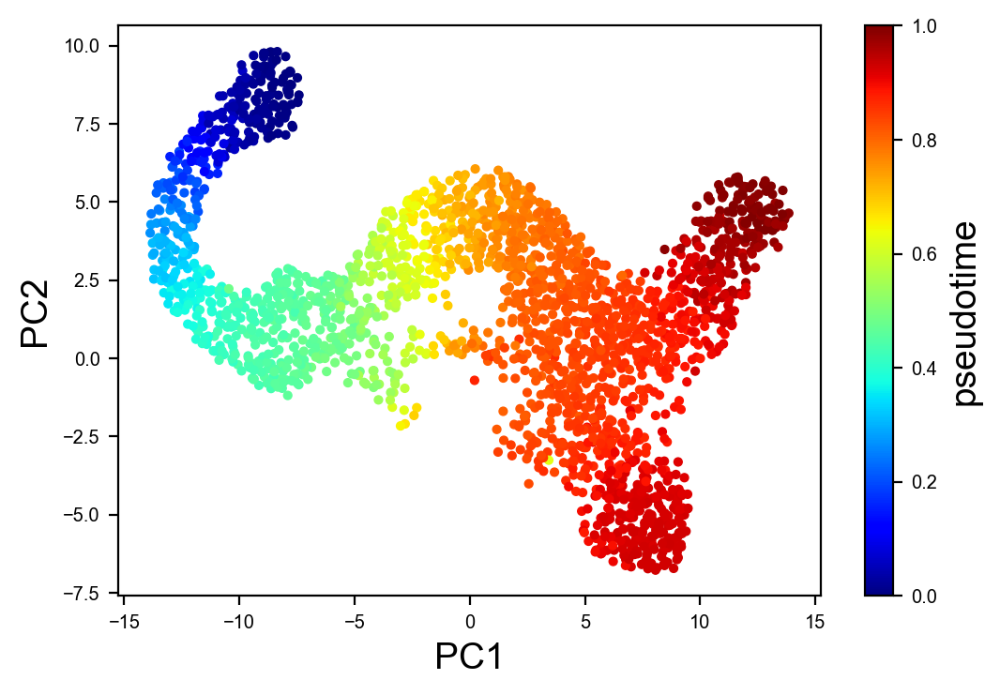

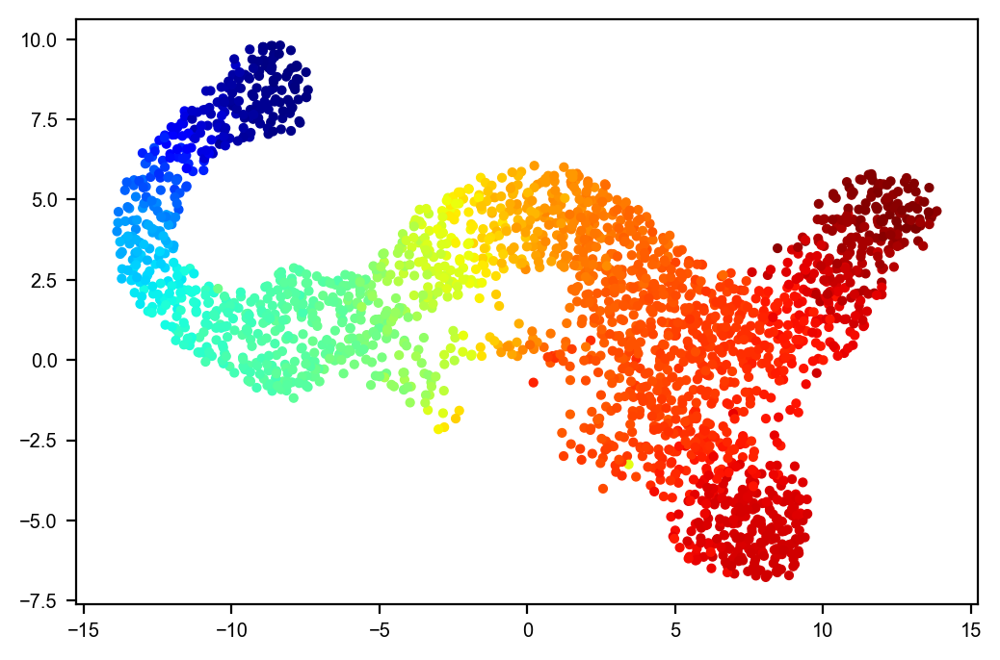

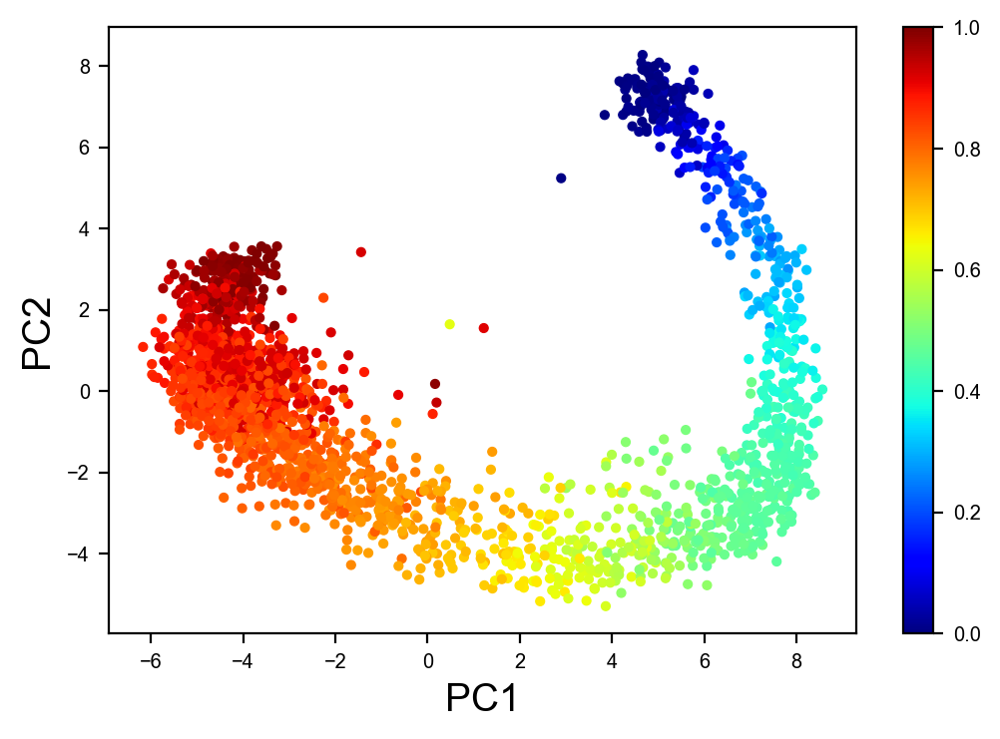

In [6]:
plt.scatter(X_umap[:,0],X_umap[:,1],s=10,c=cell_vpt,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()


clb.ax.set_ylabel('pseudotime',fontsize=14)

plt.savefig(result_path+'EG_vpt.png',dpi=300)
plt.show()

plt.scatter(X_umap[:,0],X_umap[:,1],s=10,c=cell_vpt,cmap=plt.cm.jet)
plt.show()


plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=cell_vpt,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()
plt.show()

In [7]:

row =np.array([np.ones((k_nei,))*i for i in range(adata.shape[0])]).flatten()

col=adata.uns['neighbors']['indices'].flatten()

w_val=np.array([np.linalg.norm(X_pca[int(i),:]-X_pca[int(j),:]) for i,j in zip(row,col)])

adj_val=np.ones(col.shape)

A_mat=csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

W_mat=csr_matrix((w_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

In [8]:
A_mat.A

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

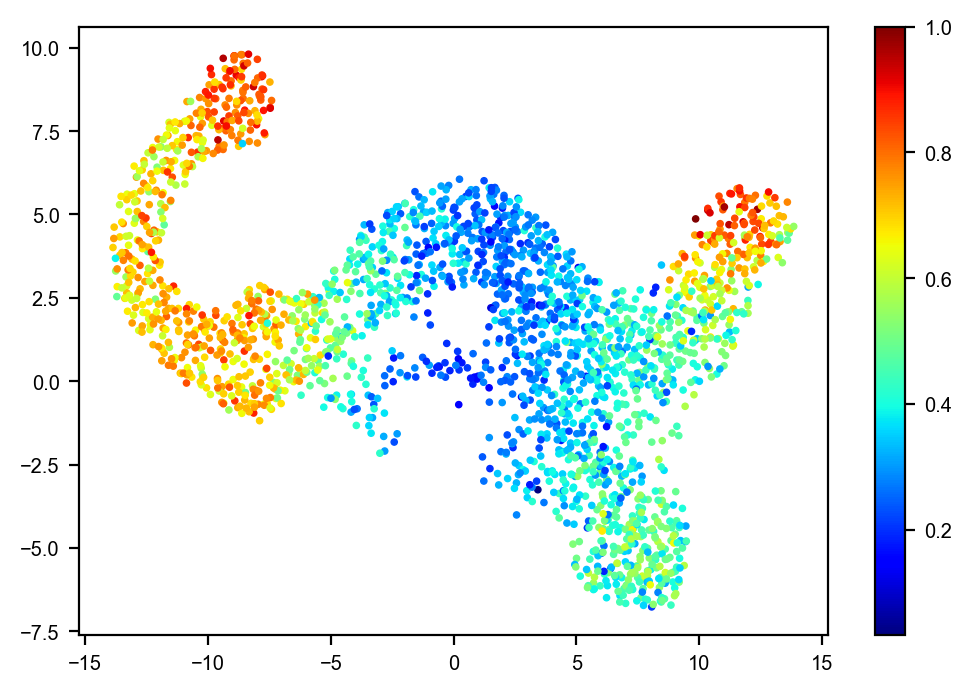

In [9]:
#--------calculate neighbor distance and define smooth funciton with gaussian kernel
#-----check "Study on density peaks clustering based on k-nearest neighbors and principal component analysis
#--------Mingjing Du et al 2016

dc=np.mean(w_val)

cell_nei=adata.uns['neighbors']['indices']
nei_w=[]
rho_arr=[]
for ni in adata.uns['neighbors']['indices']:
    dij=np.array([np.linalg.norm(X_pca[int(ni[0]),:]-X_pca[int(i),:]) for i in ni[1:]])
    
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2


plt.scatter(X_umap[:,0],X_umap[:,1],s=5,c=rho_arr,cmap=plt.cm.jet)
plt.colorbar()
plt.show()


def smooth_func(X_val,cell_nei,nei_w):
    X_sm=X_val.copy()
    for ci in range(len(X_val)):
        X_sm[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_sm

In [10]:
epochs = 500
nsamples = 5
learning_rate = 1e-3
seed = 2022
n_workers = 0
K =3#
L = 7

if seed is not None:
    reset_seeds(seed)

A=csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))
X=Xs
# X=Xs/np.mean(np.abs(Xs),axis=0)
# #--------
# scaler=StandardScaler()#
# X=scaler.fit_transform(Xs)
#-----
z=cell_vpt

n = A.shape[0]
train_nodes, val_nodes = train_test_split(n, train_ratio=1.0)
A_train = A[train_nodes, :][:, train_nodes]
X_train = X[train_nodes]
z_train = z[train_nodes]
A_val = A[val_nodes, :][:, val_nodes]
X_val = X[val_nodes]
z_val = z[val_nodes]

train_data = AttributedGraph(A_train, X_train, z_train, K)
val_data = AttributedGraph(A_val, X_val, z_val, K)


encoder = Encoder(X.shape[1], L)

In [11]:
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

iterations = epochs#epochs // n_workers
dataset = GraphDataset(train_data, nsamples, iterations)


loader = DataLoader(
    dataset,
    batch_size=1,
    num_workers=n_workers,
    worker_init_fn=reset_seeds,
    collate_fn=lambda args: args,
)

In [12]:
for batch_idx, data in enumerate(loader):
    encoder.train()
    optimizer.zero_grad()

    loss = encoder.compute_loss(data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5])
    if batch_idx% 10 == 0:
        print(batch_idx,loss)
    loss.backward()
    optimizer.step()

0 tensor(5.3275e+10, grad_fn=<DivBackward0>)
10 tensor(1.7901e+09, grad_fn=<DivBackward0>)
20 tensor(1.4350e+09, grad_fn=<DivBackward0>)
30 tensor(1.2901e+09, grad_fn=<DivBackward0>)
40 tensor(1.2344e+09, grad_fn=<DivBackward0>)
50 tensor(1.2043e+09, grad_fn=<DivBackward0>)
60 tensor(1.1909e+09, grad_fn=<DivBackward0>)
70 tensor(1.1751e+09, grad_fn=<DivBackward0>)
80 tensor(1.1702e+09, grad_fn=<DivBackward0>)
90 tensor(1.1536e+09, grad_fn=<DivBackward0>)
100 tensor(1.1540e+09, grad_fn=<DivBackward0>)
110 tensor(1.1361e+09, grad_fn=<DivBackward0>)
120 tensor(1.1338e+09, grad_fn=<DivBackward0>)
130 tensor(1.1320e+09, grad_fn=<DivBackward0>)
140 tensor(1.1399e+09, grad_fn=<DivBackward0>)
150 tensor(1.1316e+09, grad_fn=<DivBackward0>)
160 tensor(1.1251e+09, grad_fn=<DivBackward0>)
170 tensor(1.1293e+09, grad_fn=<DivBackward0>)
180 tensor(1.1318e+09, grad_fn=<DivBackward0>)
190 tensor(1.1291e+09, grad_fn=<DivBackward0>)
200 tensor(1.1211e+09, grad_fn=<DivBackward0>)
210 tensor(1.1146e+09, g

In [13]:
z=train_data.z
mu, sigma = encoder(train_data.X)
mu_learned = mu.detach().numpy()
sigma_learned = np.sqrt(sigma.detach().numpy())#sigma.detach().numpy()#

In [14]:
sort_idx = z.argsort()

match_idx=sort_idx[np.searchsorted(z,cell_vpt,sorter = sort_idx)]
print(match_idx)

[2129 1355  991 ... 2229  114 1751]


In [15]:
X_mu=mu_learned[match_idx]
X_sigma=sigma_learned[match_idx]
X_label=z[match_idx]

In [16]:
latent_z=np.zeros((X.shape[0],2*L))
for l in range(L):
    latent_z[:,2*l]=X_mu[:,l]
    latent_z[:,2*l+1]=X_sigma[:,l]

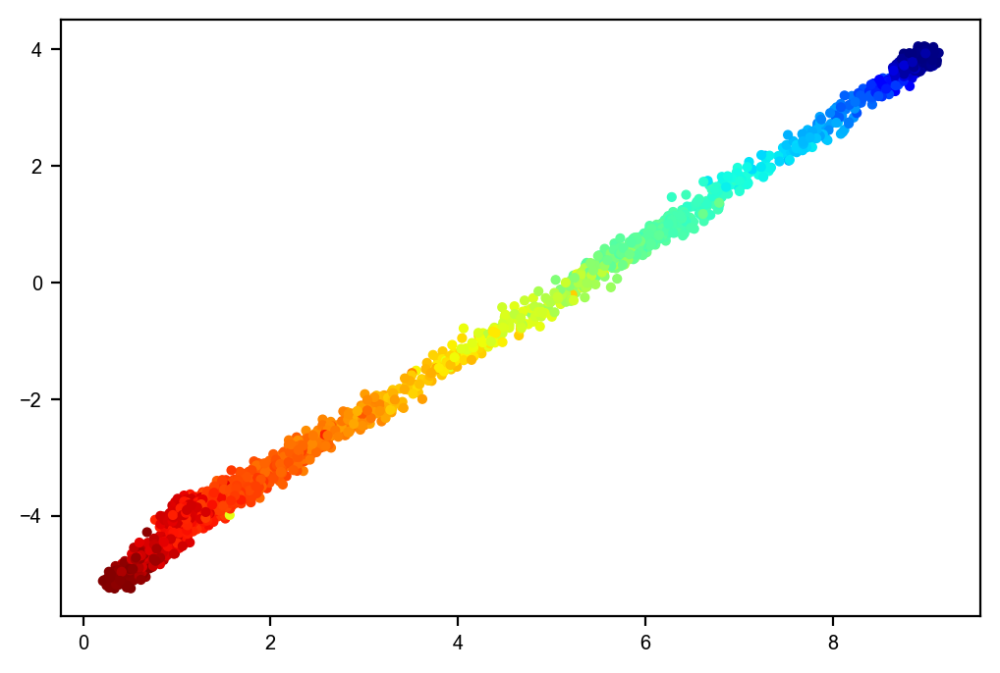

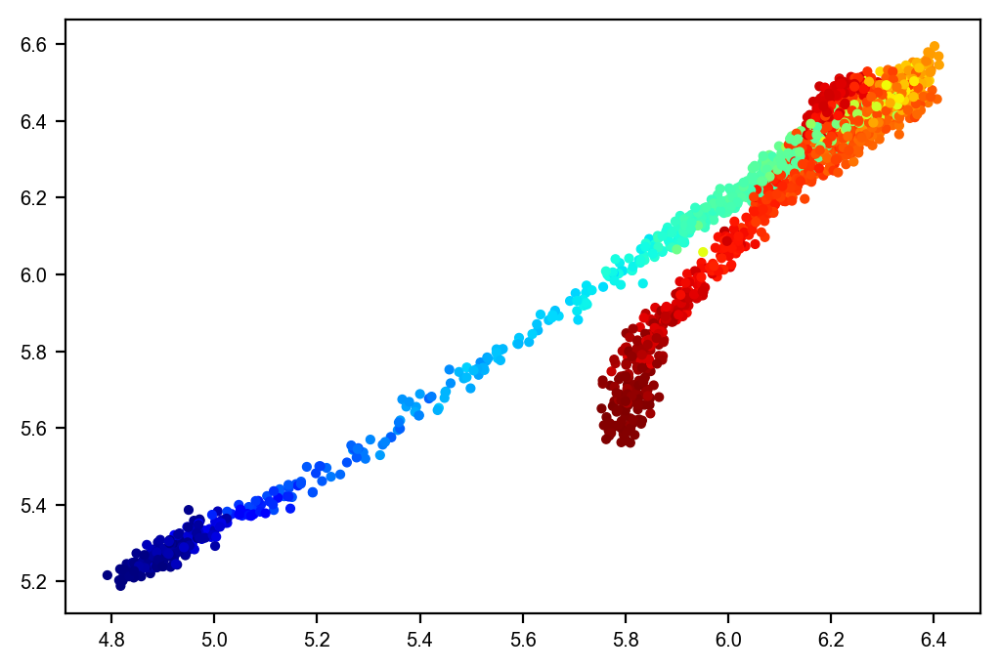

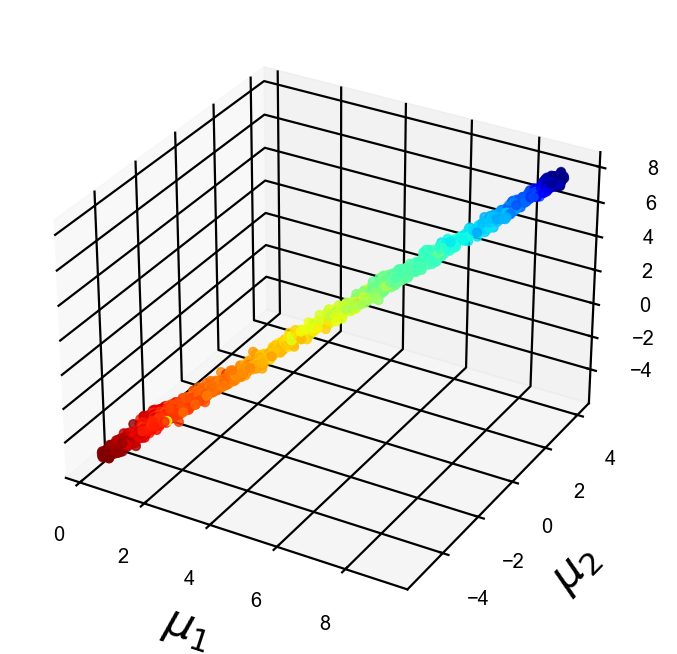

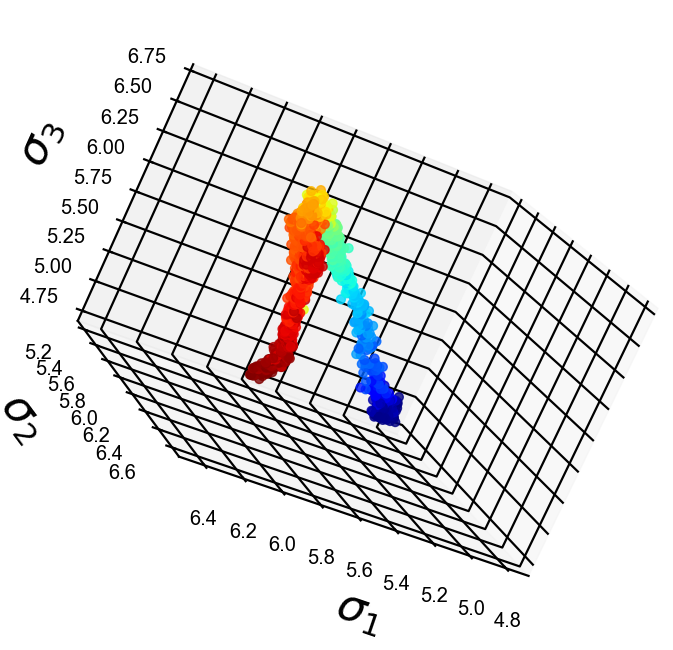

In [17]:
plt.scatter(X_mu[:,0],X_mu[:,1],s=10,c=X_label,cmap=plt.cm.jet)
plt.show()


plt.scatter(X_sigma[:,0],X_sigma[:,1],s=10,c=X_label,cmap=plt.cm.jet)
plt.show()

fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection="3d")
fig.add_axes(ax)
ax.scatter(
    X_mu[:, 0],X_mu[:, 1], X_mu[:, 2], c=X_label, s=10, alpha=0.8,cmap=plt.cm.jet
)

ax.set_xlabel("$\mu_1$",fontsize=16)
ax.set_ylabel("$\mu_2$",fontsize=16)
ax.set_zlabel("$\mu_3$",fontsize=16)
plt.savefig(result_path+'EG_Xmu_vpt.png')
plt.show()

fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection="3d")
fig.add_axes(ax)
ax.scatter(
    X_sigma[:, 0],X_sigma[:, 1], X_sigma[:, 2], c=X_label, s=10, alpha=0.8,cmap=plt.cm.jet
)

ax.set_xlabel("$\sigma_1$",fontsize=16)
ax.set_ylabel("$\sigma_2$",fontsize=16)
ax.set_zlabel("$\sigma_3$",fontsize=16)
ax.view_init(elev=10, azim=65, roll=-25)
plt.savefig(result_path+'EG_Xsigma_vpt.png')
plt.show()

In [18]:
Fisher_g=np.zeros((X.shape[0],L*2,L*2))
for i in range(X.shape[0]):
    for j in range(L):
        Fisher_g[i,2*j,2*j]=1/(X_sigma[i,j]**2)
        Fisher_g[i,2*j+1,2*j+1]=2/(X_sigma[i,j]**2)

0


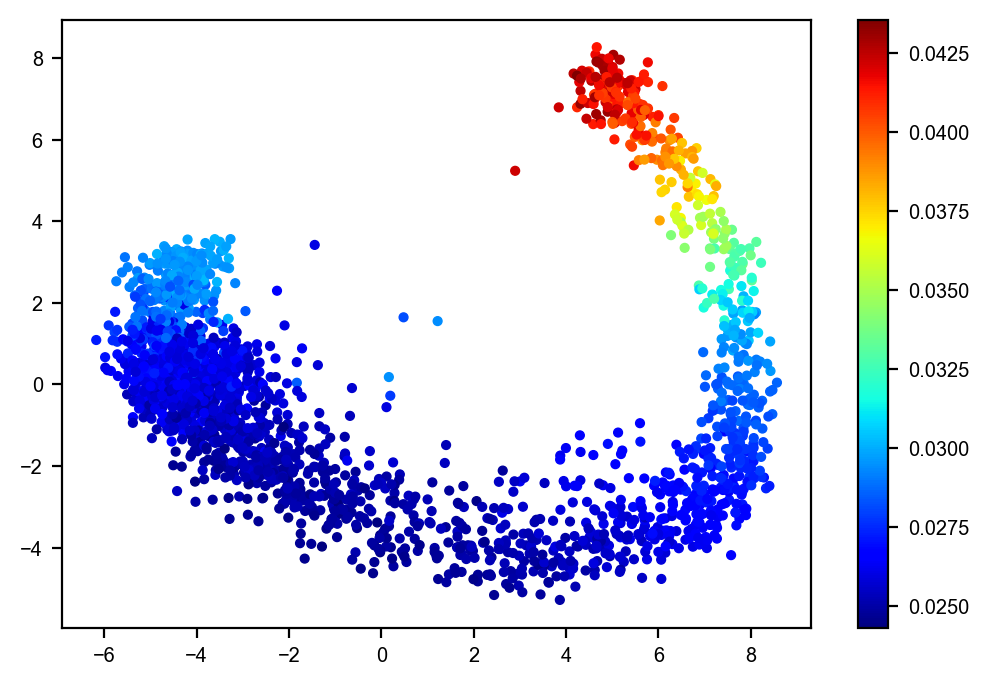

1


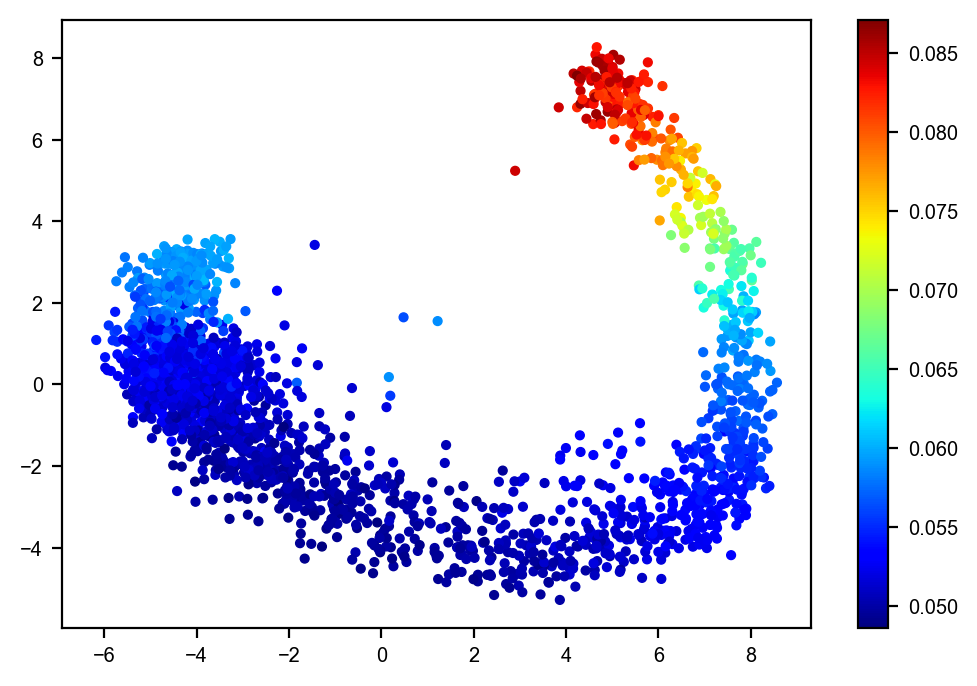

2


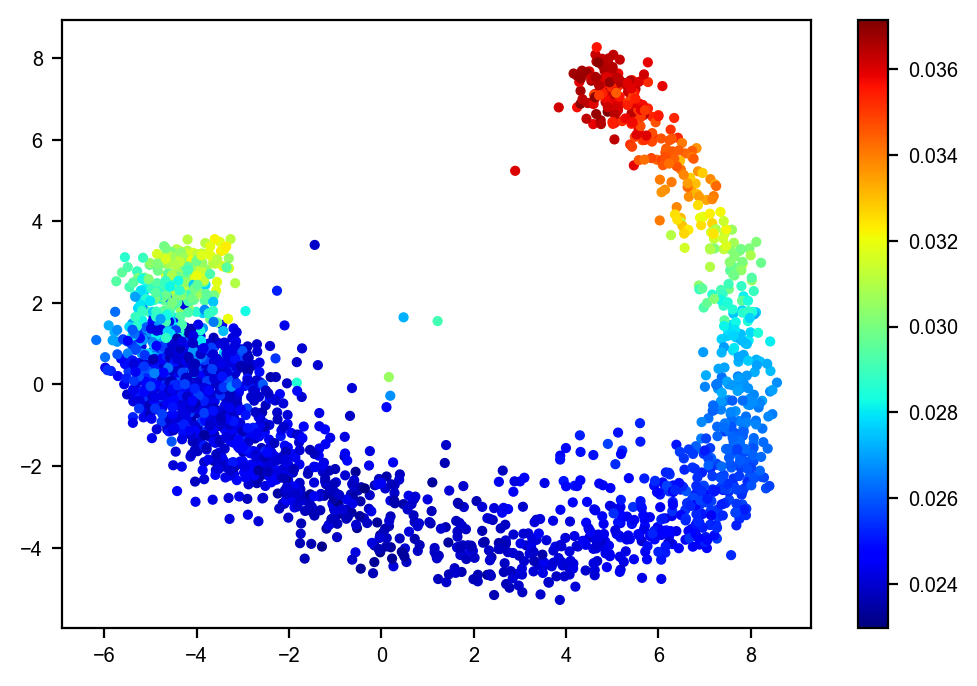

3


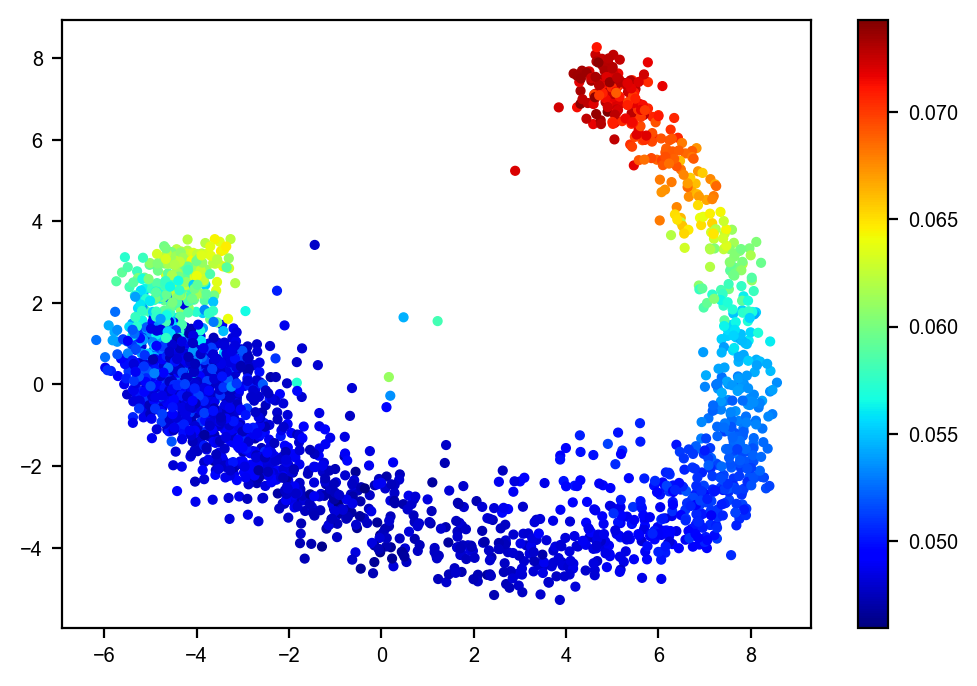

4


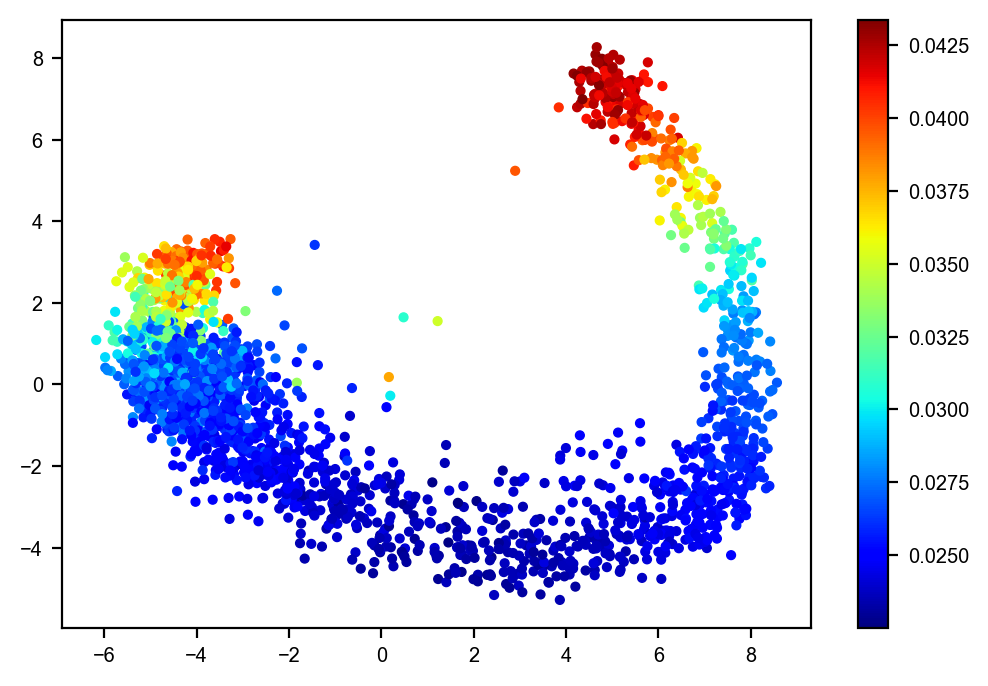

5


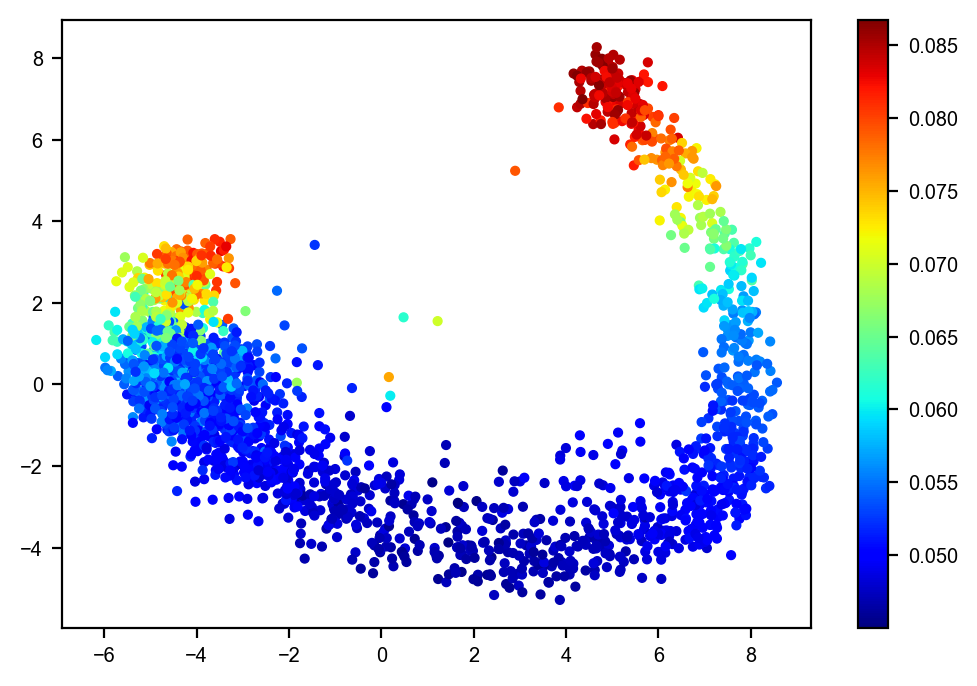

6


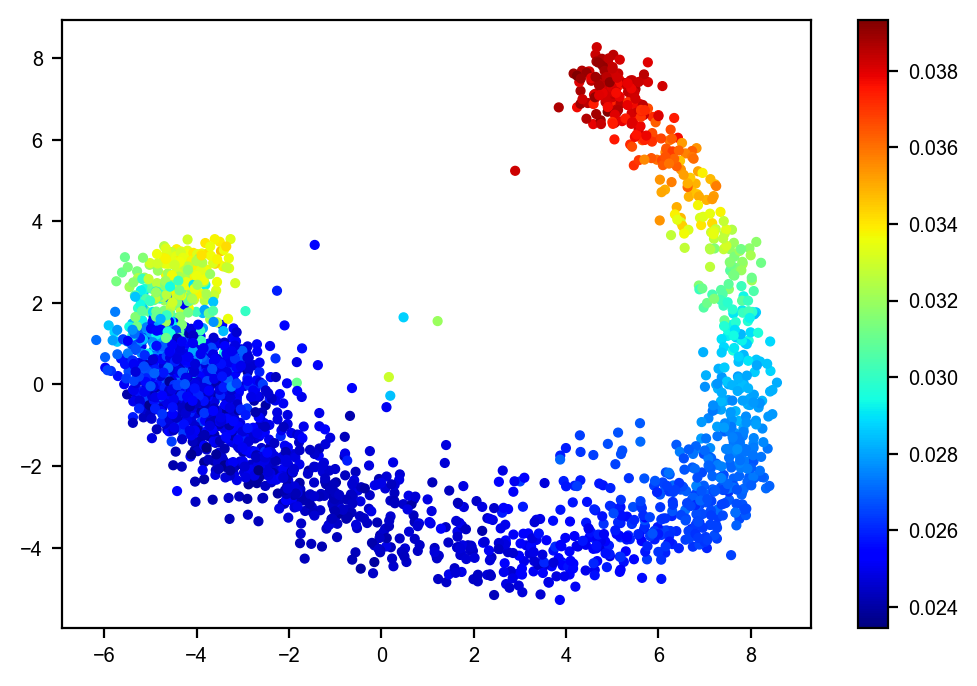

In [19]:
for j in range(L):
    print(j)
    plt.scatter(X_pca[:,0],X_pca[:,1],s=10,c=Fisher_g[:,j,j],cmap=plt.cm.jet)
    plt.colorbar()
    plt.show()


In [20]:
def wasserstein_distance(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dmu=mu1-mu2
    W_dist2=0
    Wmu_dist2=0
    Wsigma_dist2=0
    W_dist_dim=np.zeros((dim,))
    for i in range(dim):
        W_dist_dim2=dmu[i]**2+sigma1[i]**2+sigma2[i]**2-2*np.sqrt(sigma2[i]*sigma1[i]**2*sigma2[i])
        W_dist2+=W_dist_dim2
        Wmu_dist2+=dmu[i]**2
        Wsigma_dist2+=sigma1[i]**2+sigma2[i]**2-2*np.sqrt(sigma2[i]*sigma1[i]**2*sigma2[i])
        W_dist_dim[i]=np.sqrt(W_dist_dim2)
    W_dist=np.sqrt(W_dist2)
    Wmu_dist=np.sqrt(Wmu_dist2)
    Wsigma_dist=np.sqrt(Wsigma_dist2)
    return W_dist,W_dist_dim,Wmu_dist,Wsigma_dist

In [21]:
eRc_arr=[]
eRc_pos=[]
cRc_arr=[]
dWa_arr=[]
dWmu_arr=[]
dWsigma_arr=[]
dEu_arr=[]
local_Wa_dim=[]
for inds in cell_nei:
    print(inds)

    self_ind=inds[0]
    cRc=0
    eRc=0
    dWa_dim_arr=[]
    for nei_k in range(1,len(inds)):
        
        dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
        # dFi=Fisher_dist(X_mu[self_ind,:],X_sigma[self_ind,:],\
        #                 X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])
        dWa,dWa_dim,dWmu,dWsigma=wasserstein_distance(X_mu[self_ind,:],X_sigma[self_ind,:],\
                        X_mu[inds[nei_k],:],X_sigma[inds[nei_k],:])

        dWa_arr.append(dWa)
        dWmu_arr.append(dWmu)
        dWsigma_arr.append(dWsigma)
        dEu_arr.append(dEu)
        
        eRc_arr.append(1-dWa/dEu)
        eRc_pos.append((X_umap[self_ind,:]+X_umap[inds[nei_k],:])/2)
        dWa_dim_arr.append(dWa_dim)
        
        cRc+=(1-dWa/dEu)
    dWa_dim_arr=np.array(dWa_dim_arr)
    
    local_Wa_dim.append(np.mean(dWa_dim_arr,axis=0))
    
    cRc_arr.append(cRc/len(inds))
#     cRc_arr.append(cRc)

[   0  715 1868 2128 1766 1342  891   21  448  405  690  647 2210  803
 1089]
[   1  765  536 1886  328 1731  382 1345  788  807 1249 2201 1125 2254
  981]
[   2  133 1212  146  584 1716 1132 1877 1826  225 2138  644  612 1817
 1446]
[   3  942 1412  616 2044  883 1876 2043  968 1703 2256 1981  566 1022
 1164]
[   4 1596 1236  366  465 2244 1010  112  918 1185 1104 1748 1495 1530
 1913]
[   5 1180 1726 1399  590 1445 1290  129  493 1474  495  184 1750 1822
  756]
[   6 1271 2162  920 1129   67  473 1796  569  566  217 1286 1971 1166
 1753]
[   7   50 2072 1683  724 1648   37 1084 1664 1507 1289  399 1967 1453
  708]
[   8  257 1045 2243 2111 1331  224  301 1044  487  830 1567 1808 2001
 1144]
[   9 1694  861   78 1037 1130  556  233   71 2199  780  884   44   55
  523]
[  10  515   92  112  962  886 1878  481  958  383  818  494 1710 1209
 2009]
[  11 1123  884 1089 2123 1283   71 1284 2297  533  233 1207  719 1915
 1392]
[  12  286 1864  153 2269  684 1729 1636 1489 1437 1738  805   1

(32508,) (32508, 2)


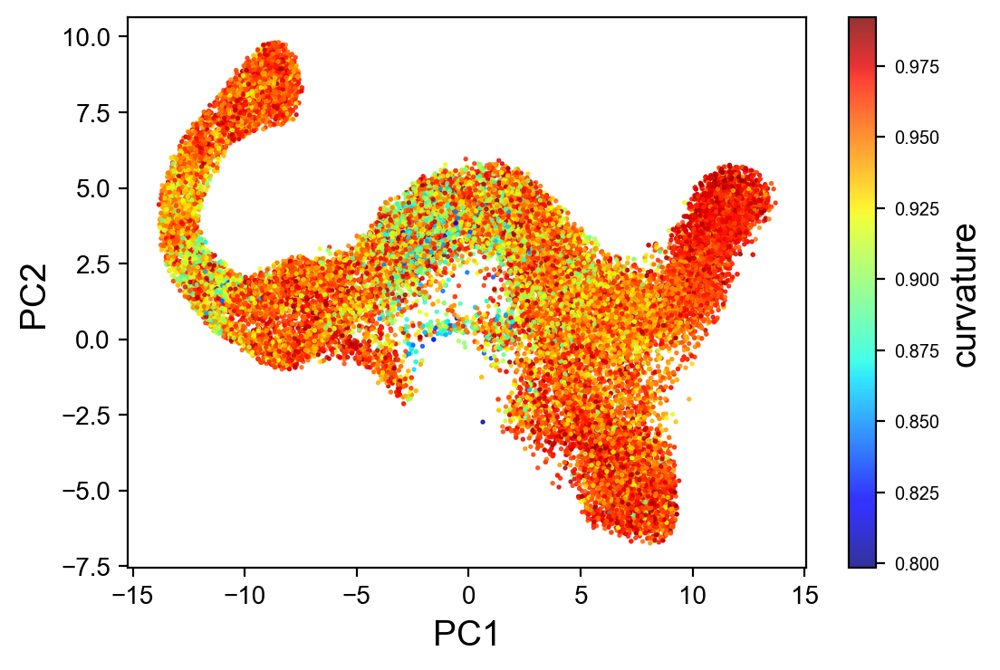

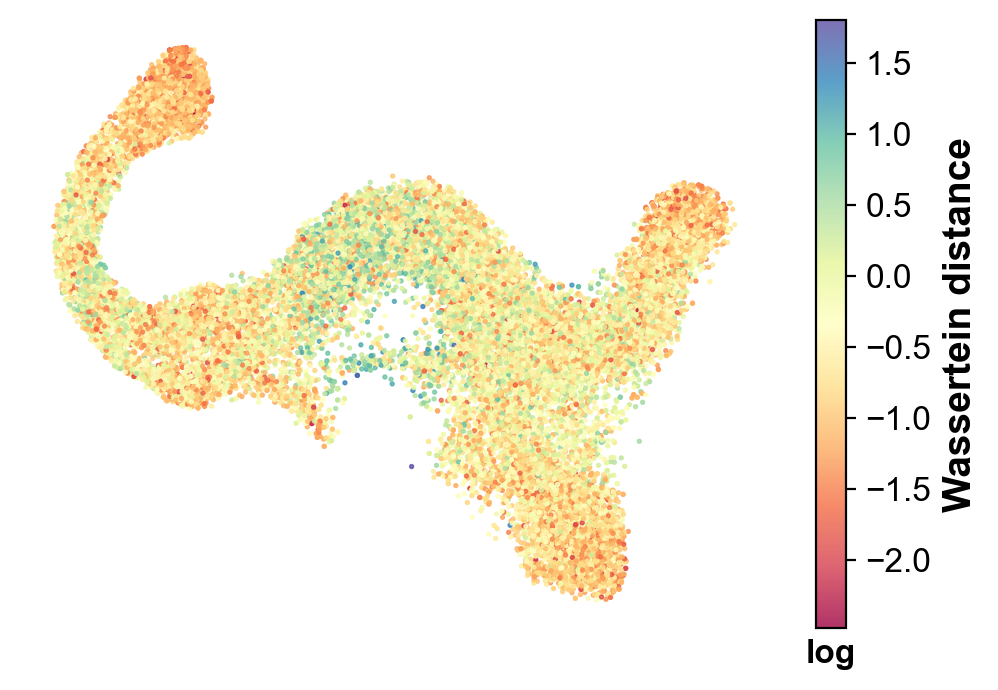

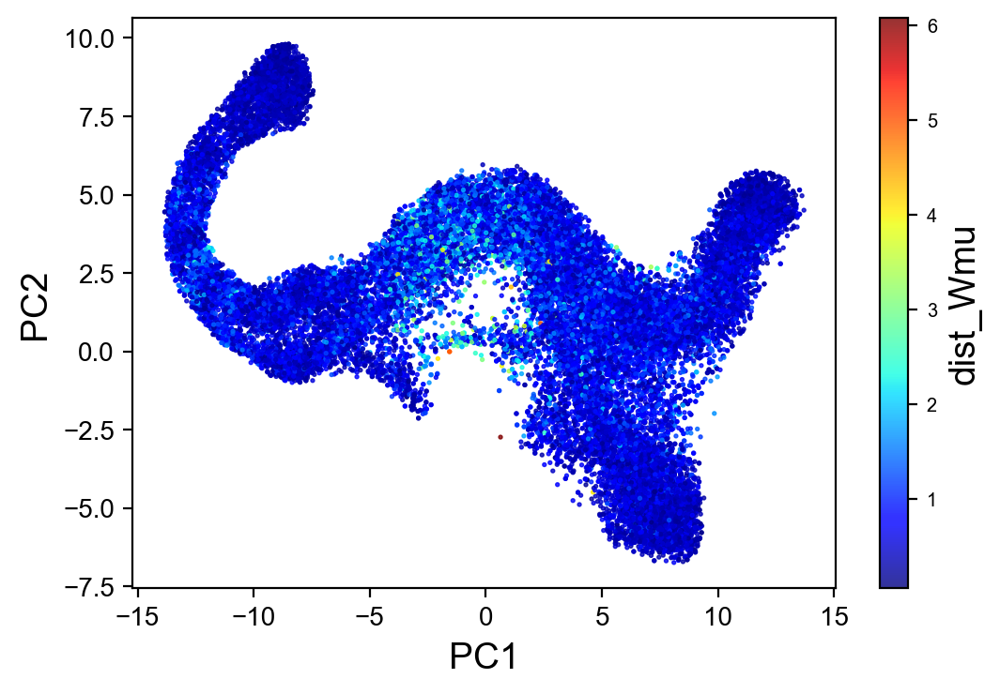

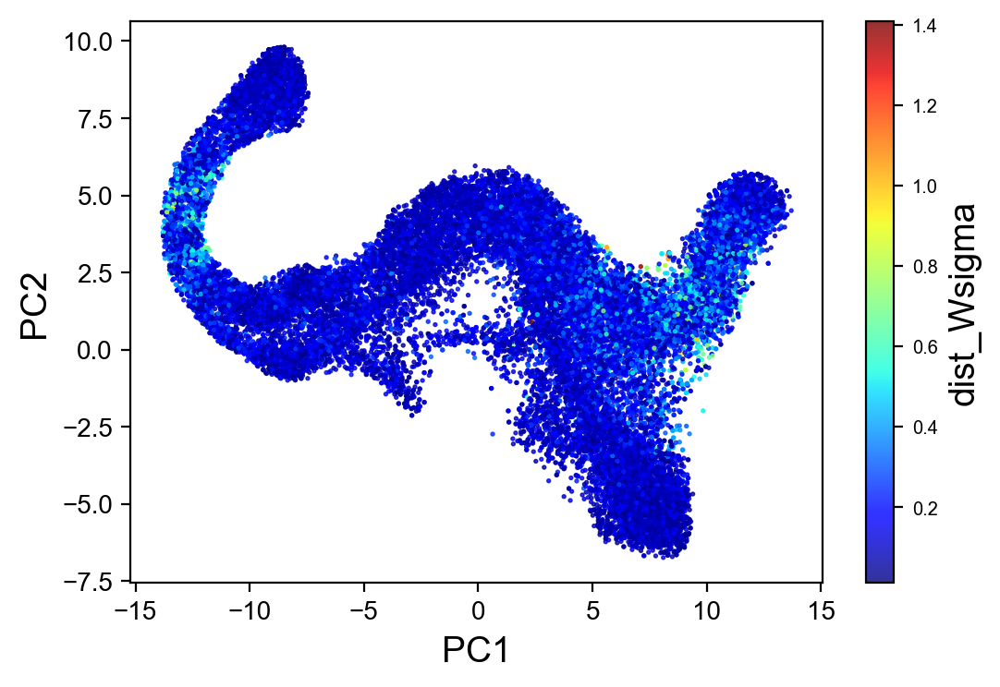

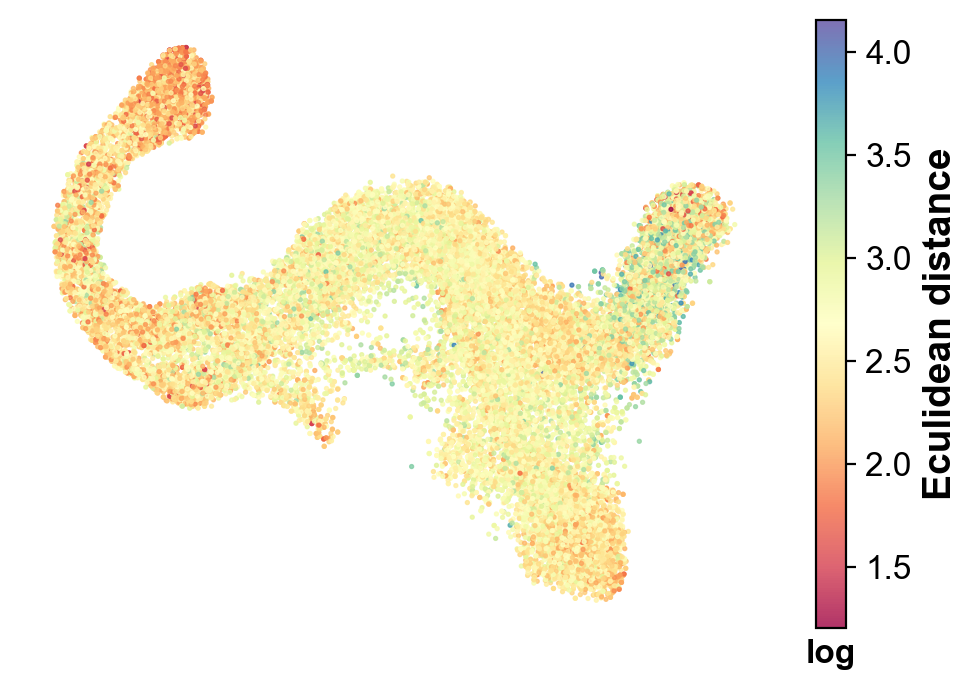

In [22]:
eRc_arr=np.array(eRc_arr)
eRc_pos=np.array(eRc_pos)
cRc_arr=np.array(cRc_arr)
dWa_arr=np.array(dWa_arr)
dWmu_arr=np.array(dWmu_arr)
dWsigma_arr=np.array(dWsigma_arr)
dEu_arr=np.array(dEu_arr)
local_Wa_dim=np.array(local_Wa_dim)
print(eRc_arr.shape,eRc_pos.shape)
plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=eRc_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()
clb.ax.set_ylabel('curvature',fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.savefig(result_path+'EG_edge_curvature.png')
plt.show()

plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=np.log(dWa_arr), s=2, alpha=0.8,cmap=plt.cm.Spectral)
clb=plt.colorbar()
clb.ax.set_xlabel('log',fontsize=12,weight='bold')
clb.ax.set_ylabel('Wassertein distance',fontsize=14,weight='bold')
clb.ax.tick_params(axis='y', labelsize=12)
plt.axis('off')
plt.savefig(result_path+'EG_Wassertein.png',dpi=600)
plt.show()

plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=dWmu_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()
clb.ax.set_ylabel('dist_Wmu',fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=dWsigma_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()
clb.ax.set_ylabel('dist_Wsigma',fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

plt.scatter(eRc_pos[:,0],eRc_pos[:,1], c=np.log(dEu_arr), s=2, alpha=0.8,cmap=plt.cm.Spectral)
clb=plt.colorbar()
clb.ax.set_ylabel('Eculidean distance',fontsize=14,weight='bold')
clb.ax.set_xlabel('log',fontsize=12,weight='bold')
clb.ax.tick_params(axis='y', labelsize=12)
plt.axis('off')
plt.savefig(result_path+'EG_Eculidean.png',dpi=600)
plt.show()

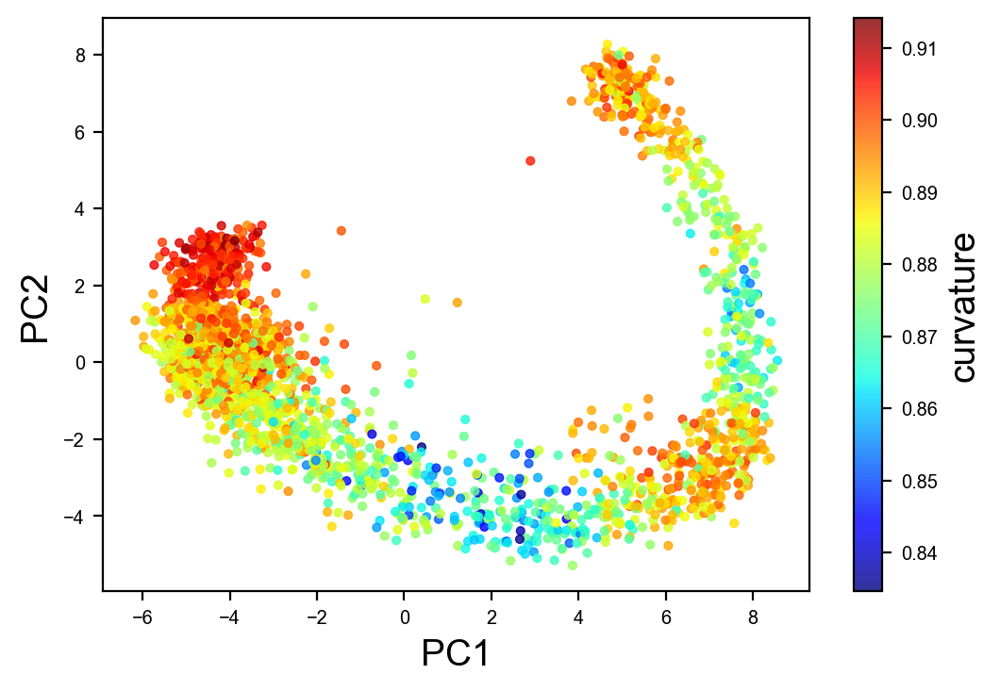

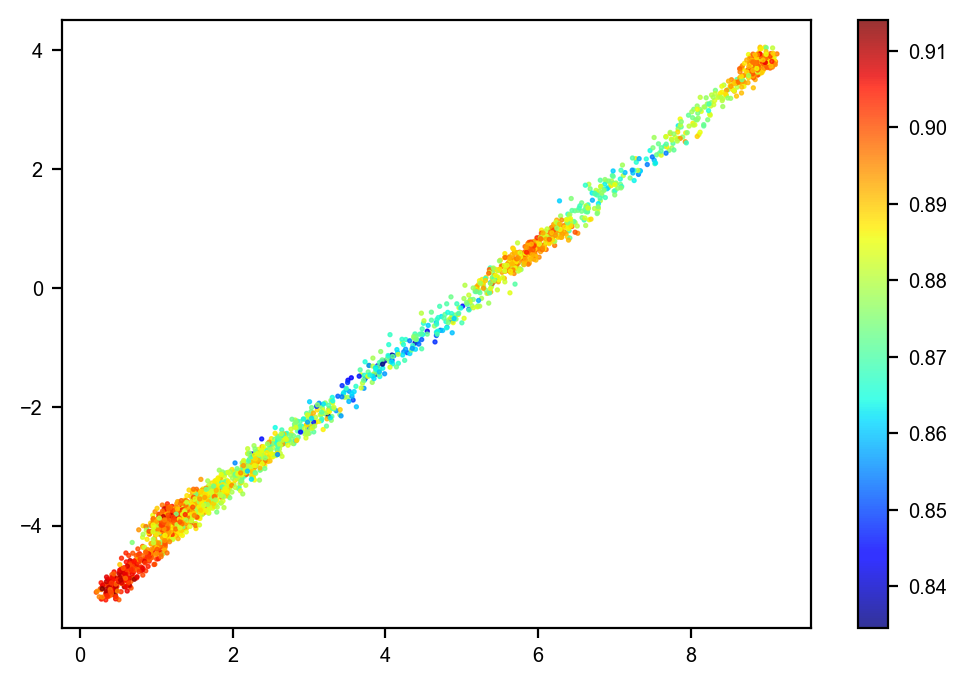

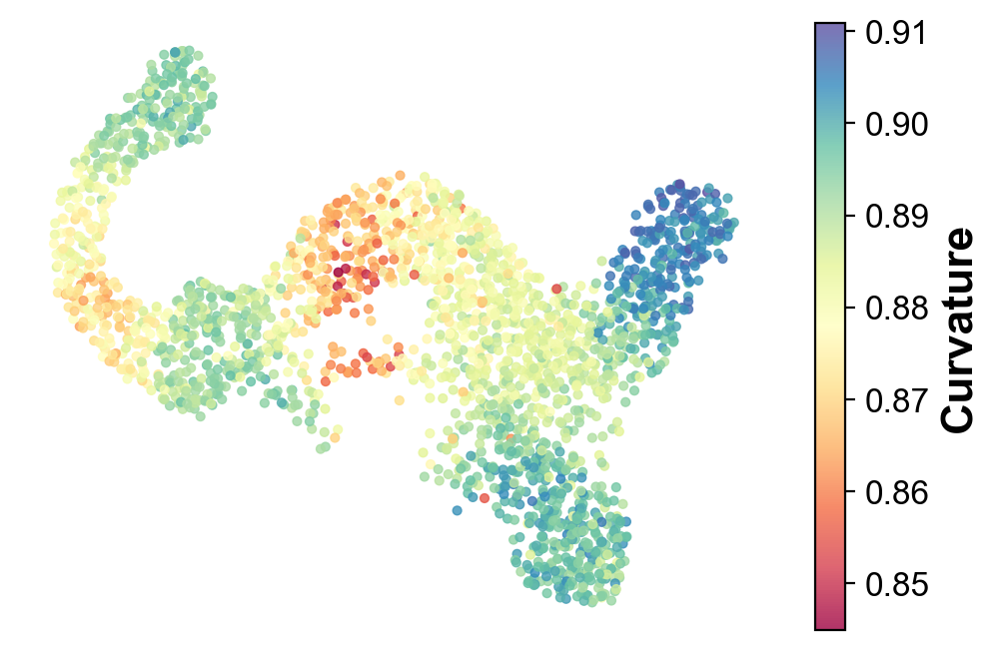

In [23]:
plt.scatter(X_pca[:,0],X_pca[:,1], c=cRc_arr, s=10, alpha=0.8,cmap=plt.cm.jet)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)

clb=plt.colorbar()

clb.ax.set_ylabel('curvature',fontsize=14)
plt.savefig(result_path+'EG_curvature.png')
plt.show()

plt.scatter(X_mu[:,0],X_mu[:,1], c=cRc_arr, s=2, alpha=0.8,cmap=plt.cm.jet)
plt.colorbar()
plt.show()


cRc_smooth=cRc_arr.copy()
for ci in range(len(cRc_arr)):
    cRc_smooth[ci]=np.dot(cRc_arr[cell_nei[ci,:]],nei_w[ci,:])
    
    
plt.scatter(X_umap[:,0],X_umap[:,1], c=cRc_smooth, s=10, alpha=0.8,cmap=plt.cm.Spectral)
plt.xlabel('PC1',fontsize=14)
plt.ylabel('PC2',fontsize=14)
clb=plt.colorbar()
clb.ax.set_ylabel('Curvature',fontsize=16,fontweight='bold')
clb.ax.tick_params(axis='y', labelsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.axis('off')
plt.savefig(result_path+'EG_curvature.png')
plt.show()

In [24]:
eigs = np.zeros((X.shape[0],L))
eig_max=np.zeros((X.shape[0],))
sorted_eigs= np.zeros((X.shape[0],L))
eig_ratio=np.zeros((X.shape[0],L))
eig_max_ind=np.zeros((X.shape[0],L))
for i in range(X.shape[0]):
    eig = np.diag(Fisher_g[i])[::2]
    eigs[i] =eig 
    sorted_eigs[i]= eig[np.argsort(eig)[::-1]]
    eig_ratio[i]=eigs[i,:]/np.sum(eigs[i])
    eig_max_ind[i]=np.argsort(eig)[::-1]
    eig_max[i]=np.amax(eig)



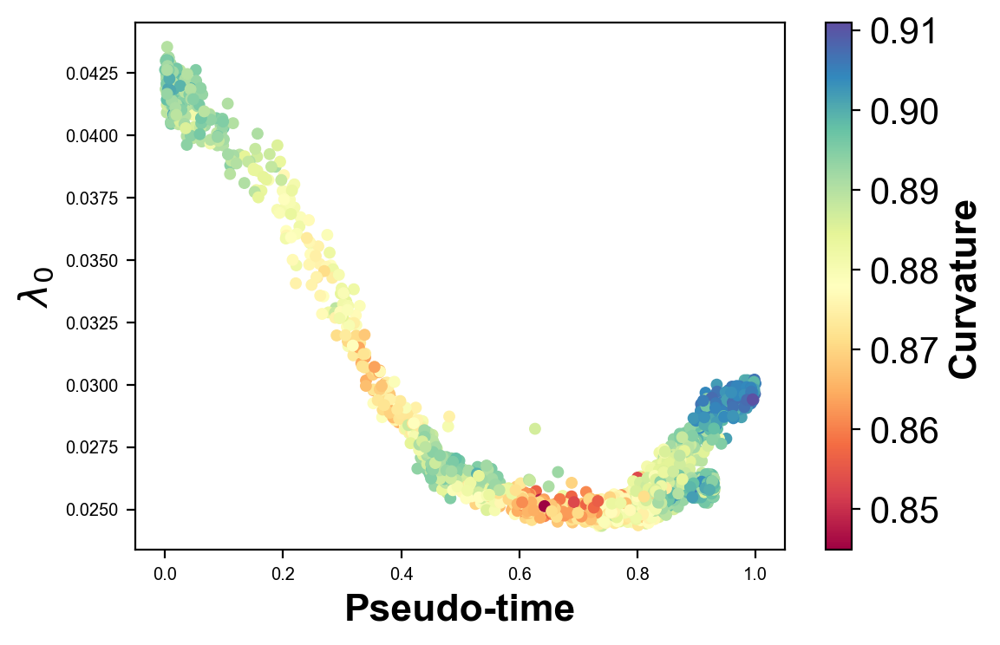

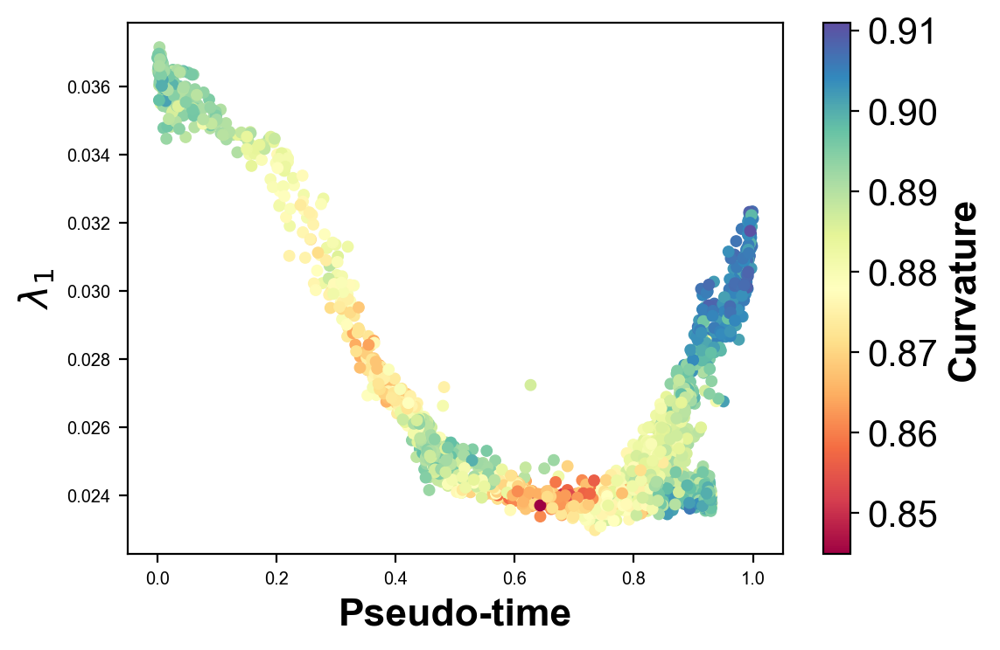

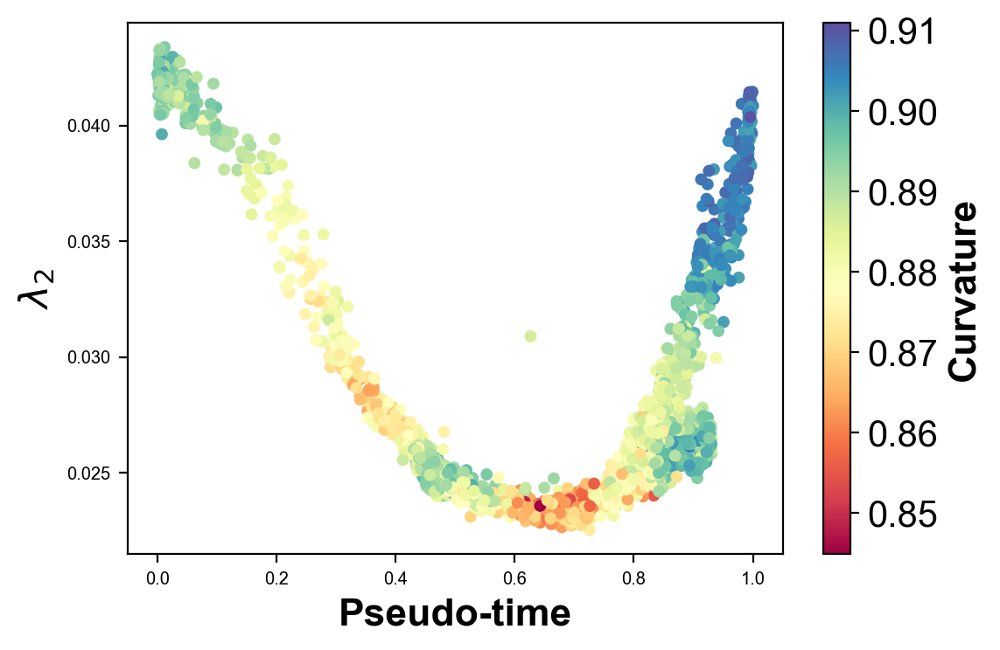

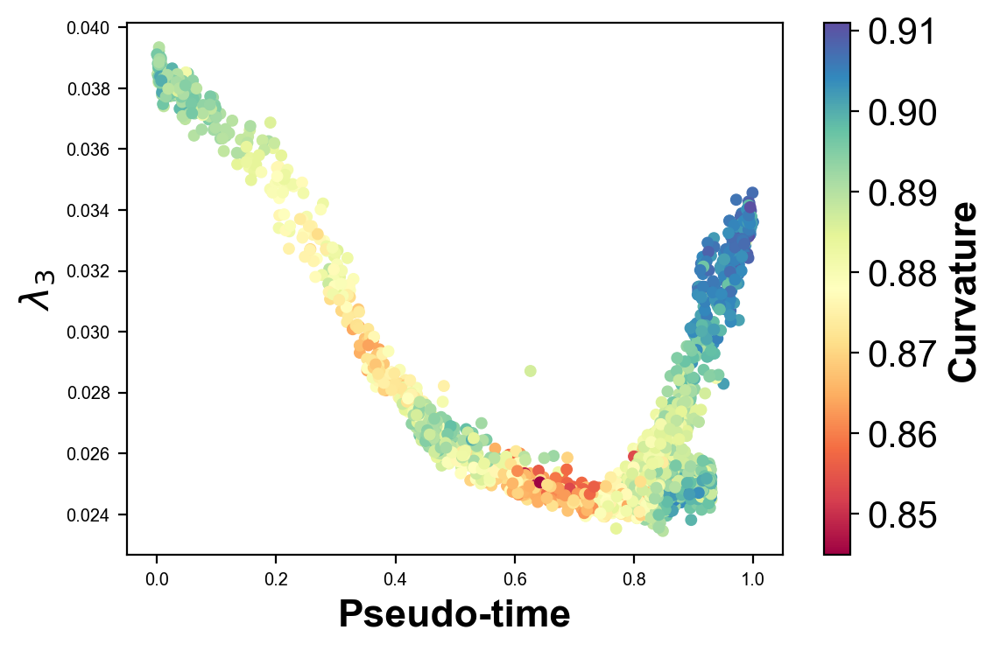

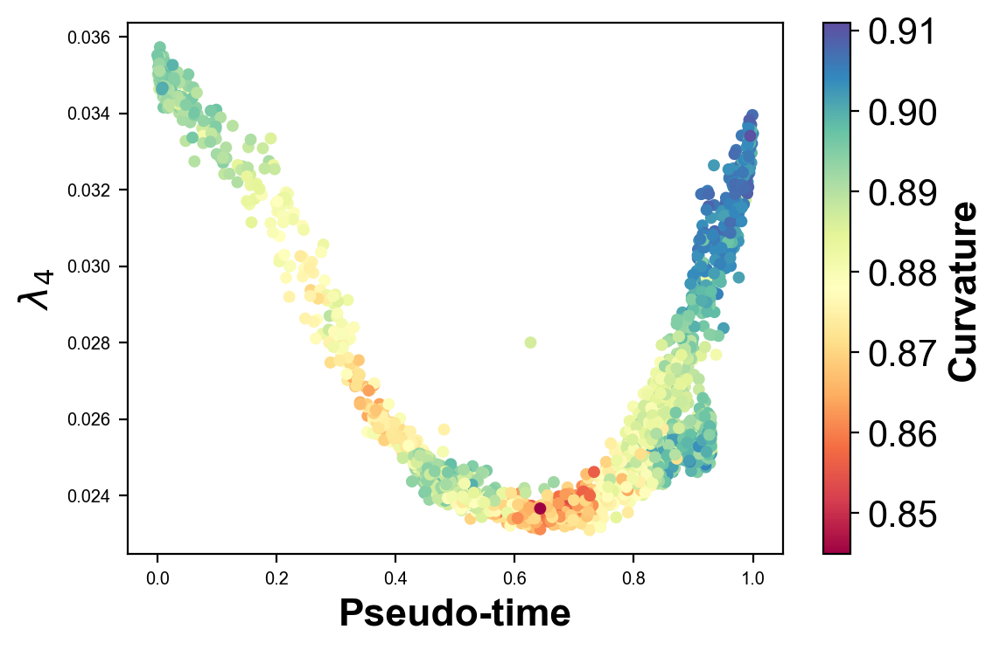

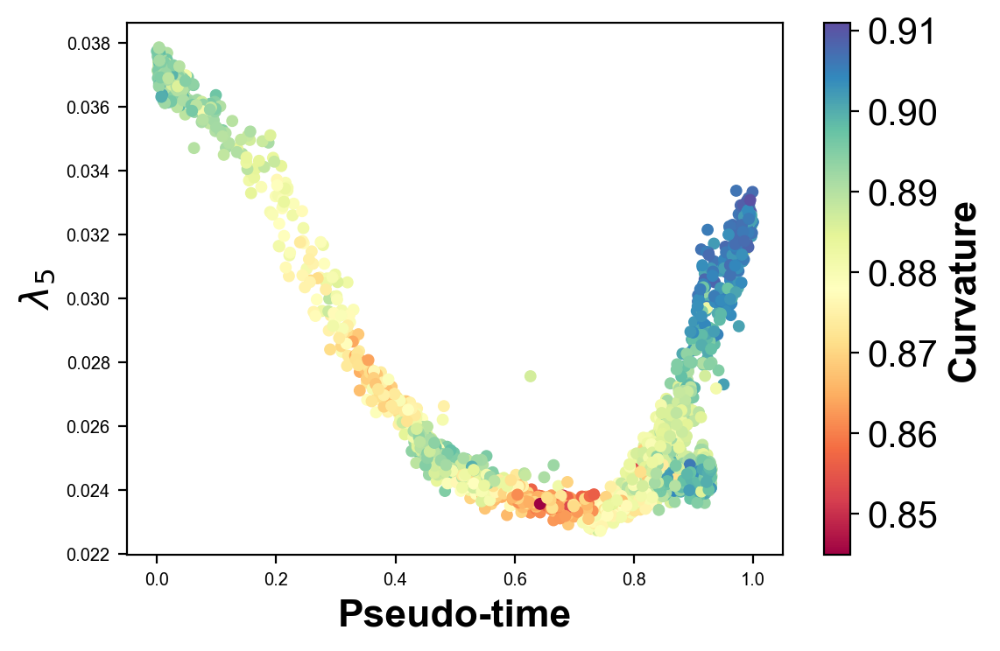

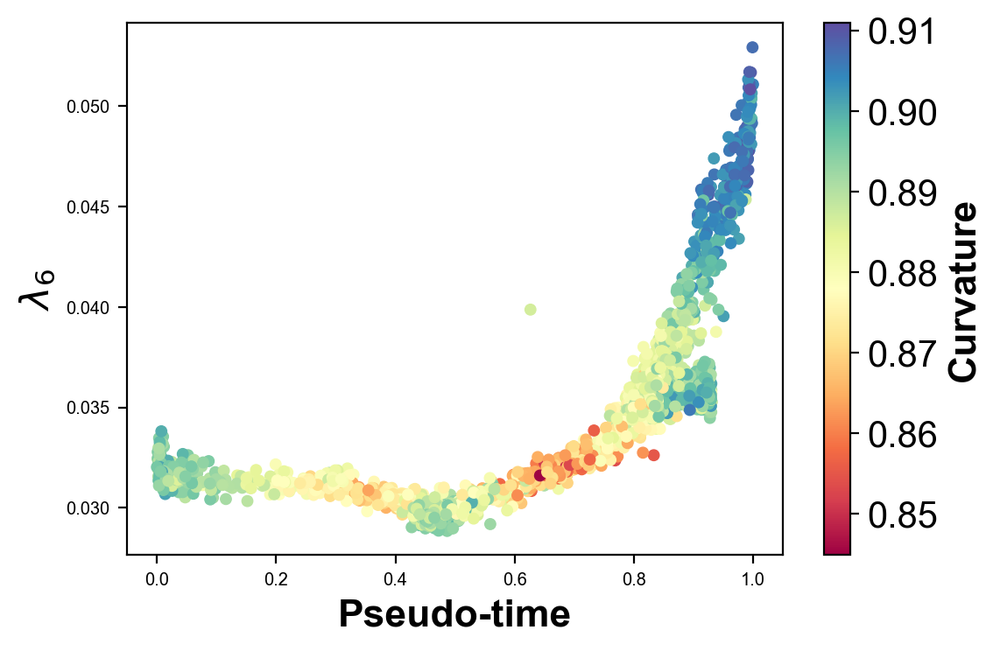

In [26]:
for i in range(L):
    cmap = plt.colormaps['Spectral']
    plt.scatter(cell_vpt, eigs[:,i],c=cRc_smooth, cmap=cmap, s=20)
    # plt.axis('off')
    
    clb=plt.colorbar()
    clb.ax.set_ylabel('Curvature',fontsize=16,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    
    plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
    plt.ylabel(f'$\lambda_{i}$',fontsize=16,weight='bold')
    plt.show()
    plt.show()

In [27]:
from scipy.stats import pearsonr
from tqdm import tqdm
from scipy.stats import entropy

import networkx as nx
import leidenalg as la
import igraph as ig



In [28]:
"""分析每个细胞的局部邻域维度相关性"""
print("分析局部维度相关性...")
n_cells=X.shape[0]
corr_threshold=0.3
rev=1.0


# 存储每个细胞的局部相关性矩阵
local_corr_matrices = np.zeros((n_cells, L, L))
local_corr_types = np.zeros((n_cells, L, L))  # 1=正相关, -1=负相关
positive_corr_strength = np.zeros((n_cells, L))
negative_corr_strength = np.zeros((n_cells, L))
cell_dim=[]
# local_dmu_arr=np.zeros((n_cells, L))

for i in tqdm(range(n_cells)):
    # 获取当前细胞的局部邻域
    neighbors = cell_nei[i]
    local_indices = neighbors.tolist()
    # print(local_indices)
    local_data = eigs[local_indices,:]
    pos_strength = np.zeros(L)
    neg_strength = np.zeros(L)
    
    # 计算局部邻域内的维度相关性
    for d1 in range(L):
        for d2 in range(d1+1, L):
            # 计算皮尔逊相关系数
            corr, _ = pearsonr(local_data[:, d1], local_data[:, d2])
            local_corr_matrices[i, d1, d2] = corr
            local_corr_matrices[i, d2, d1] = corr

            if corr > corr_threshold:
                pos_strength[d1] += corr
                pos_strength[d2] += corr
            elif corr < -corr_threshold:
                neg_strength[d1] += abs(corr)
                neg_strength[d2] += abs(corr)
            # # 标记相关性类型
            if abs(corr) > corr_threshold:
                if corr > 0:
                    local_corr_types[i, d1, d2] = corr#1
                    local_corr_types[i, d2, d1] = corr#1
                else:
                    local_corr_types[i, d1, d2] = corr#-1
                    local_corr_types[i, d2, d1] = corr#-1
                    
    positive_corr_strength[i] = pos_strength
    negative_corr_strength[i] = neg_strength



分析局部维度相关性...


100%|██████████████████████████████████████| 2322/2322 [00:15<00:00, 145.77it/s]


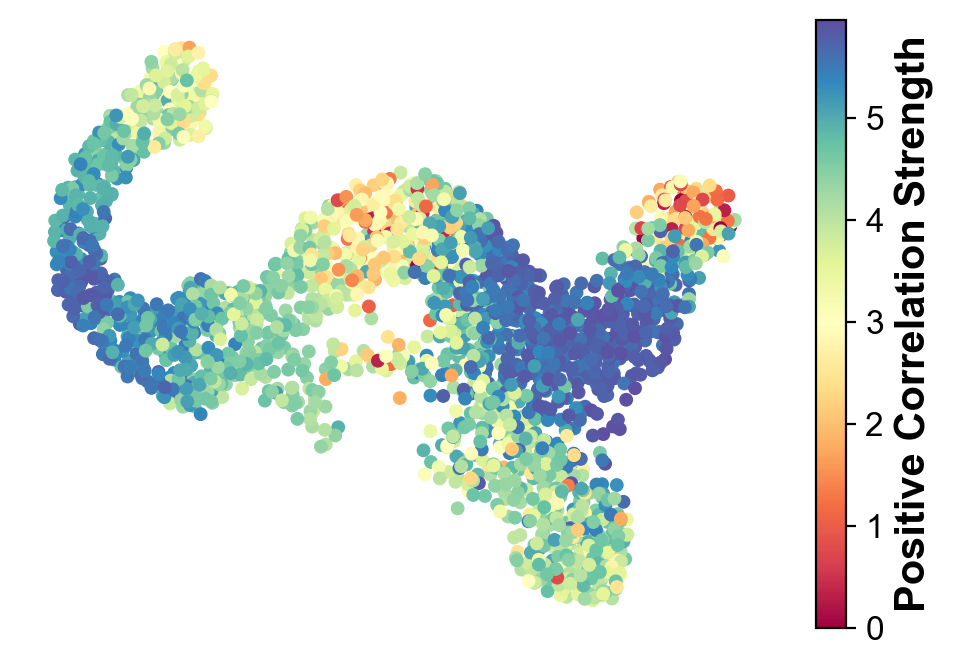

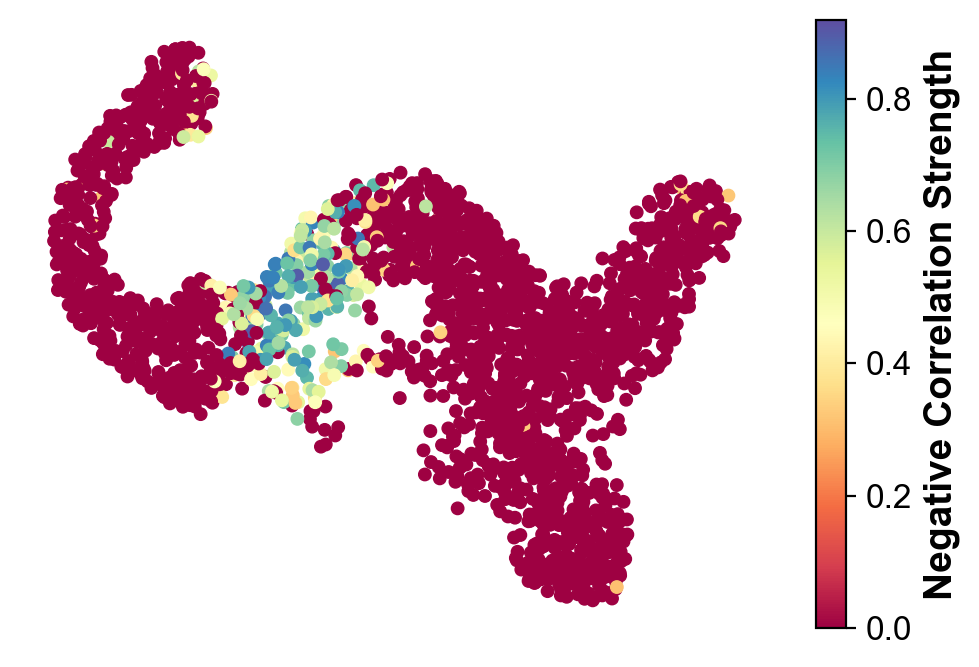

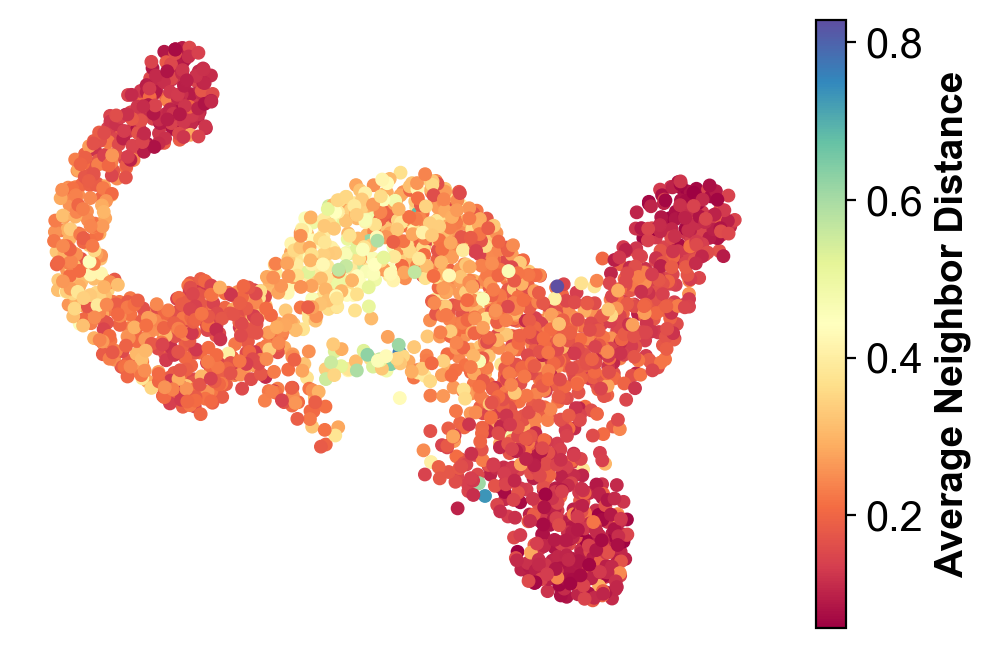

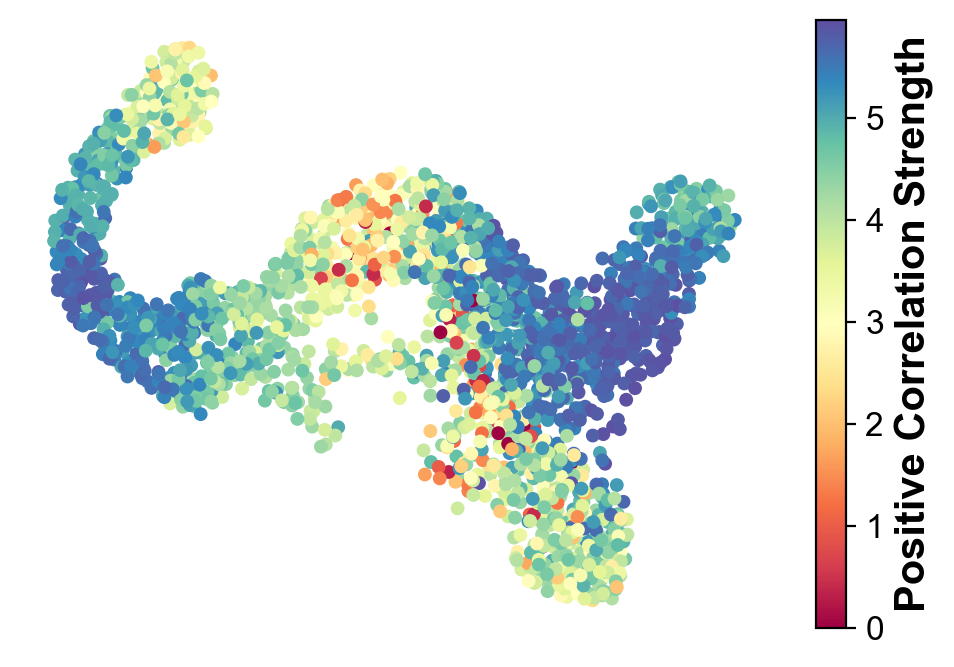

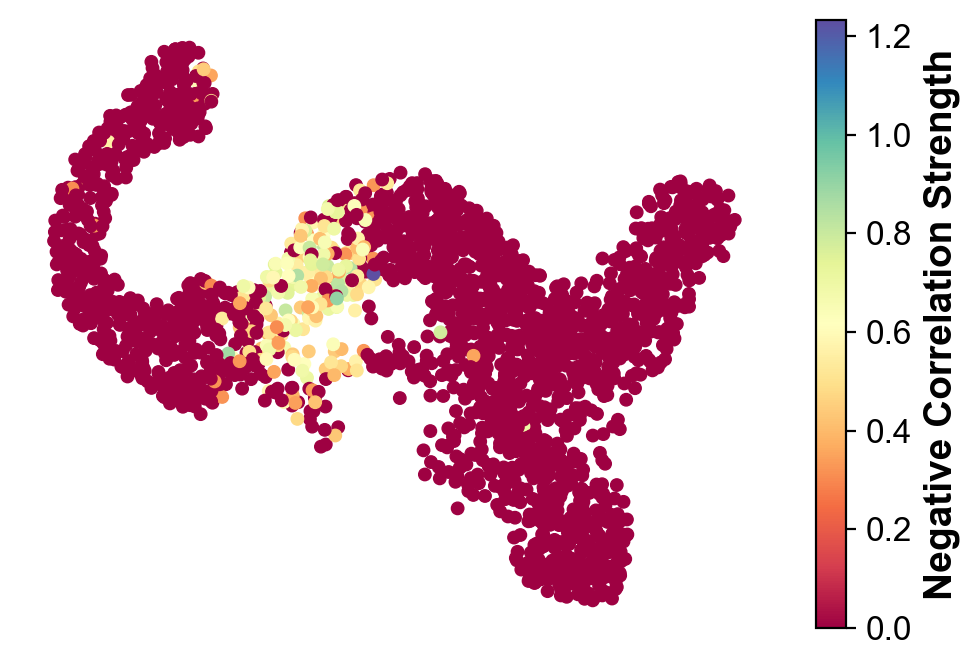

...

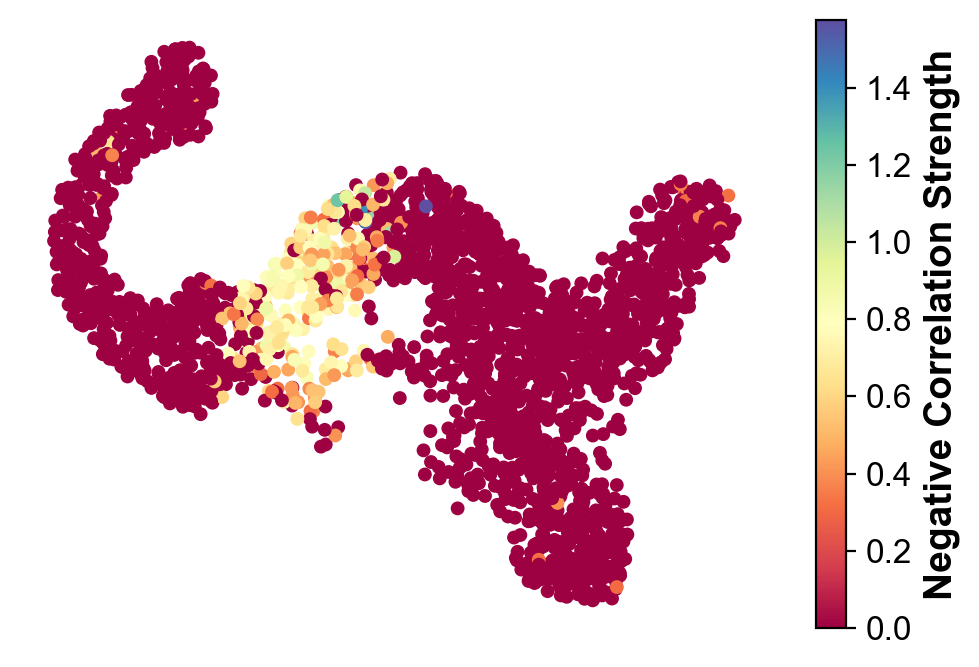

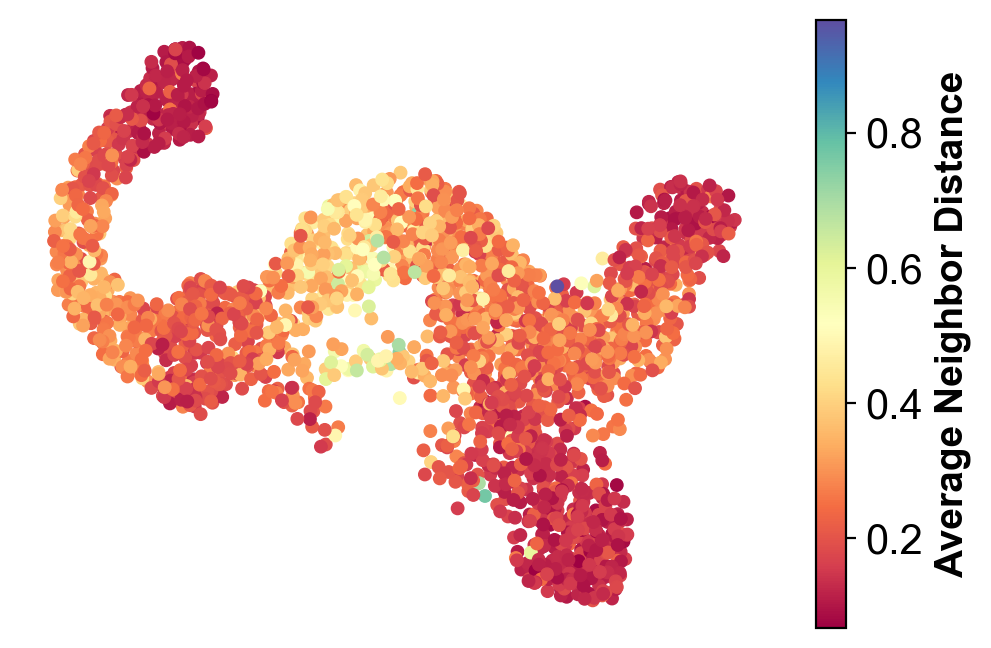

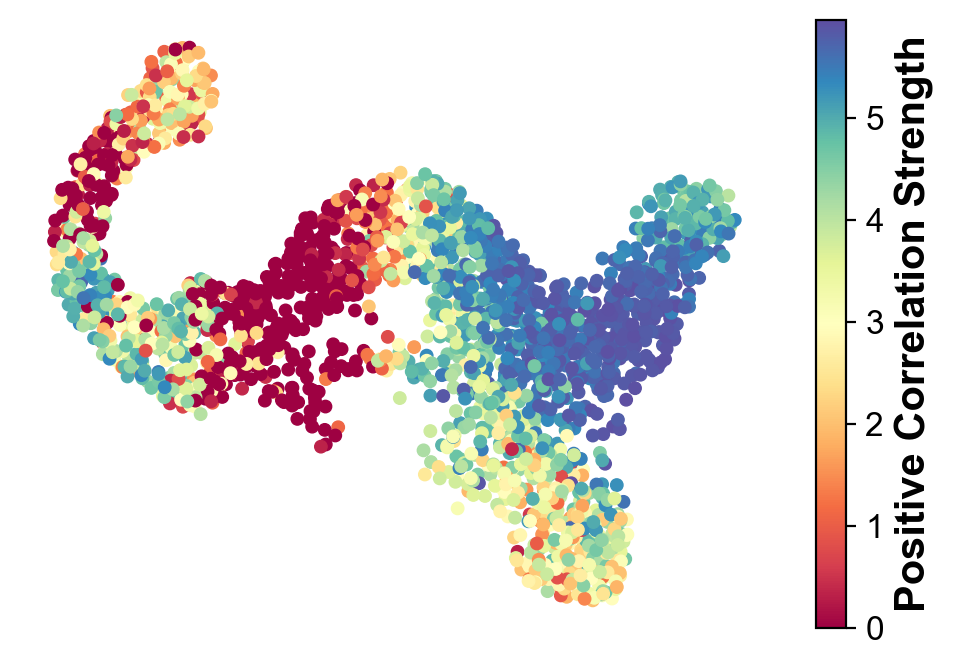

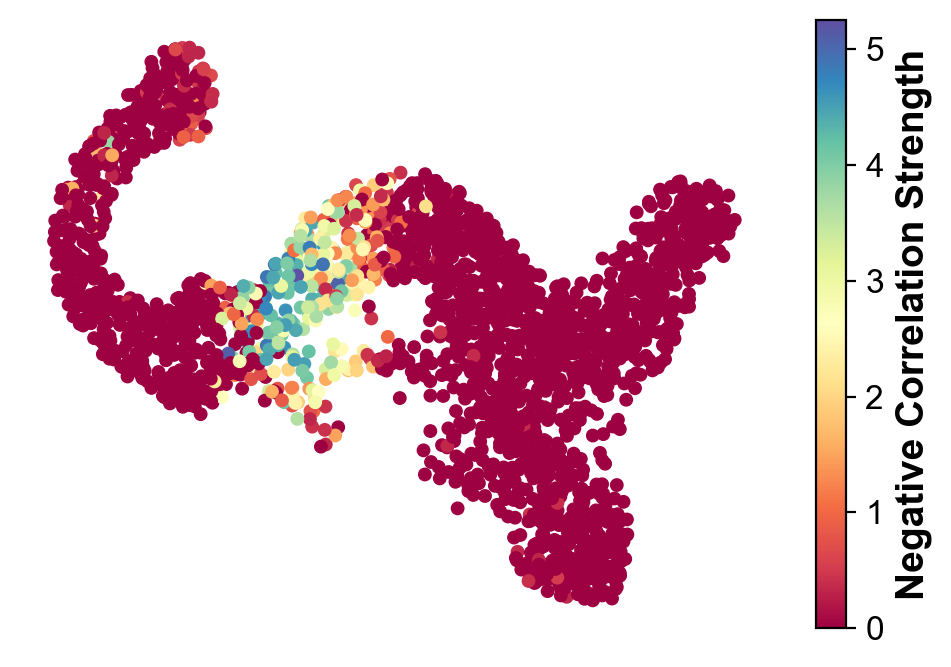

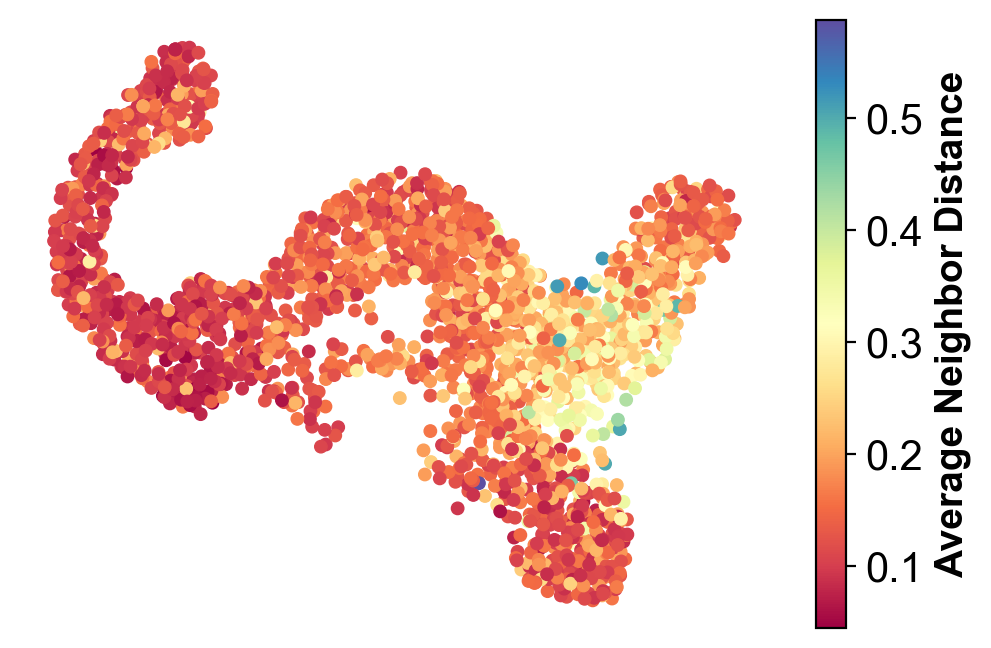

In [30]:

for i in range(L):
    cmap = plt.colormaps['Spectral']
    plt.scatter(X_umap[:,0], X_umap[:,1],c=positive_corr_strength[:,i], cmap=cmap, s=20)
    # plt.axis('off')
    
    clb=plt.colorbar()
    clb.ax.set_ylabel('Positive Correlation Strength',fontsize=15,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=12)

    plt.axis('off')
    plt.show()

    plt.scatter(X_umap[:,0], X_umap[:,1],c=negative_corr_strength[:,i], cmap=cmap, s=20)
    # plt.axis('off')
    
    clb=plt.colorbar()
    clb.ax.set_ylabel('Negative Correlation Strength',fontsize=14,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=12)
    plt.axis('off')
    plt.savefig(result_path+'neg_corr'+str(i)+'.png',dpi=300)

    plt.show()


    # # cmap = plt.colormaps['Spectral']
    plt.scatter(X_umap[:,0], X_umap[:,1],c=local_Wa_dim[:,i], cmap=cmap, s=20)
    # plt.axis('off')
    
    clb=plt.colorbar()
    clb.ax.set_ylabel('Average Neighbor Distance',fontsize=14,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)
    plt.axis('off')
    plt.savefig(result_path+'mean_nei_dist'+str(i)+'.png')

    plt.show()


In [33]:
eps=1e-8
local_corr_mat=local_corr_matrices.reshape((n_cells,L*L))
local_corr_neg_mean=[np.mean(local_corr_mat[i,(local_corr_mat[i,:]-eps)<-corr_threshold]) for i in range(n_cells)]
local_corr_neg=[np.sum((local_corr_mat[i,:]<-corr_threshold).astype(np.float32))/2 for i in range(n_cells)]

local_corr_pos_mean=[np.mean(local_corr_mat[i,(local_corr_mat[i,:]+eps)>corr_threshold]) for i in range(n_cells)]
local_corr_pos=[np.sum((local_corr_mat[i,:]>corr_threshold).astype(np.float32))/2 for i in range(n_cells)]

In [34]:
local_corr_neg_mean=np.array(local_corr_neg_mean)
local_corr_neg_mean=np.nan_to_num(local_corr_neg_mean,0)
local_corr_neg=np.array(local_corr_neg)

local_corr_pos_mean=np.array(local_corr_pos_mean)
local_corr_pos=np.array(local_corr_pos)

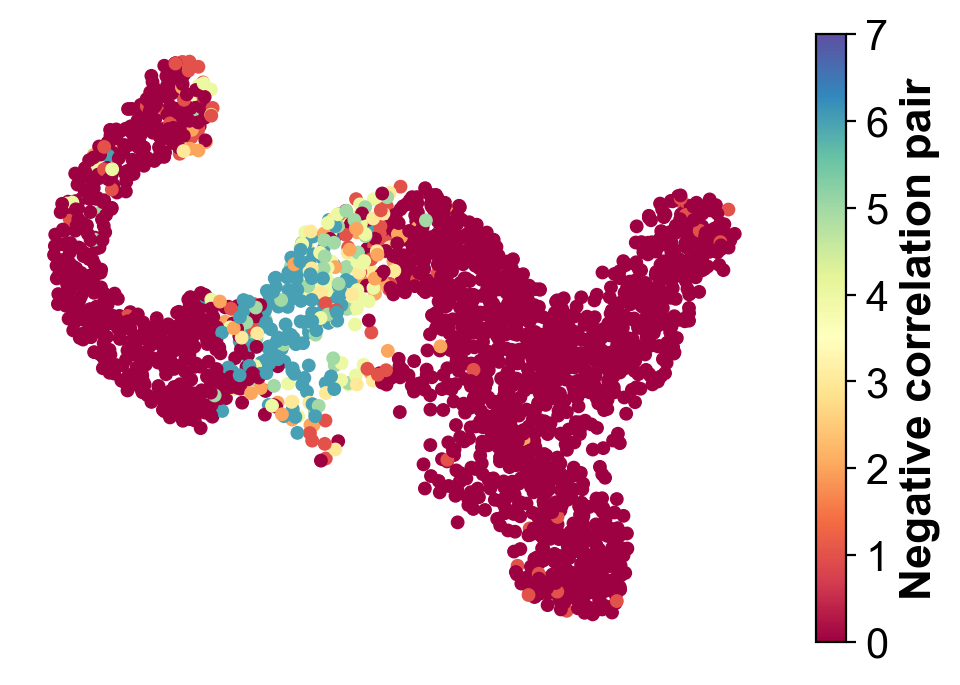

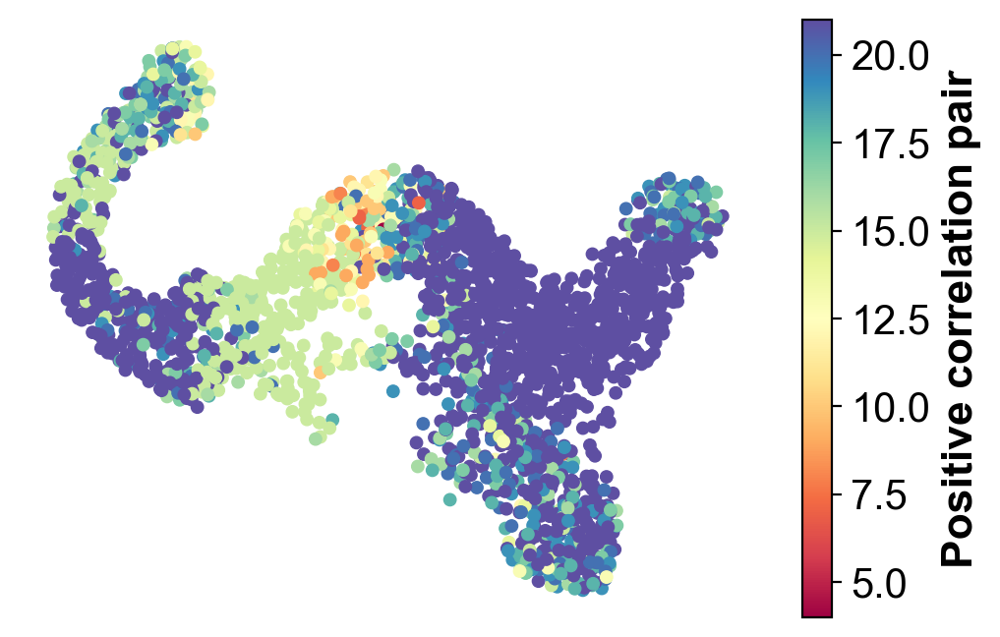

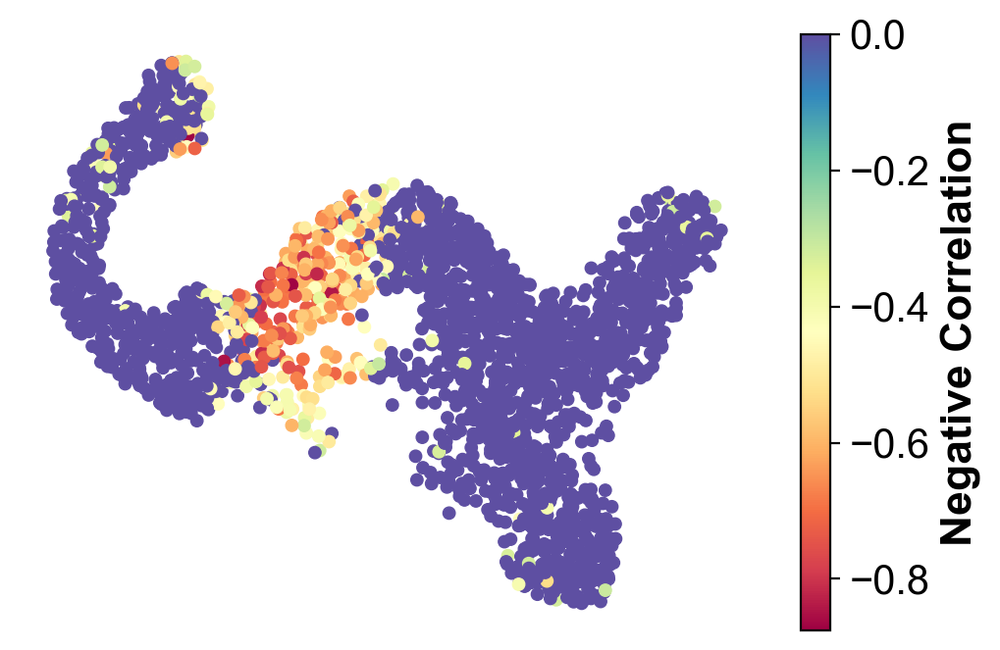

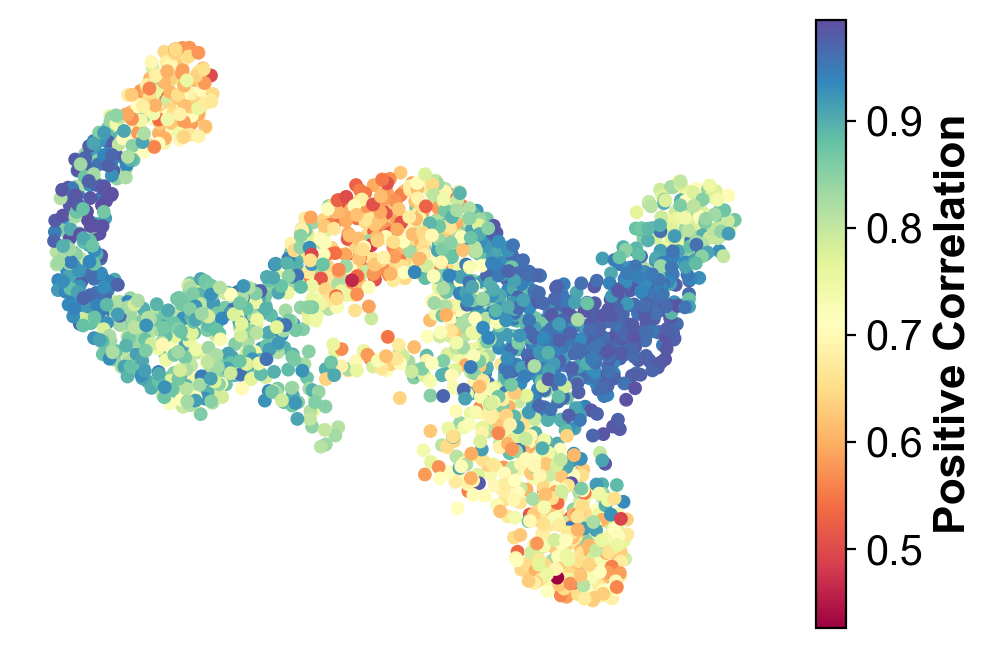

In [35]:
cmap = plt.colormaps['Spectral']
plt.scatter(X_umap[:,0], X_umap[:,1],c=local_corr_neg, cmap=cmap, s=20)
# plt.axis('off')
clb=plt.colorbar()
clb.ax.set_ylabel('Negative correlation pair',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
plt.axis('off')
# plt.ylabel(f'$\lambda_{i}$',fontsize=16,weight='bold')
plt.savefig(result_path+'EG_neg_corr.png')

plt.show()

plt.scatter(X_umap[:,0], X_umap[:,1],c=local_corr_pos, cmap=cmap, s=20)
# plt.axis('off')
clb=plt.colorbar()
clb.ax.set_ylabel('Positive correlation pair',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
plt.axis('off')
# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
# plt.ylabel(f'$\lambda_{i}$',fontsize=16,weight='bold')
plt.show()

plt.scatter(X_umap[:,0], X_umap[:,1],c=local_corr_neg_mean, cmap=cmap, s=20)
# plt.axis('off')
clb=plt.colorbar()
clb.ax.set_ylabel('Negative Correlation',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
plt.axis('off')
# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
# plt.ylabel(f'$\lambda_{i}$',fontsize=16,weight='bold')
plt.show()

plt.scatter(X_umap[:,0], X_umap[:,1],c=local_corr_pos_mean, cmap=cmap, s=20)
# plt.axis('off')
clb=plt.colorbar()
clb.ax.set_ylabel('Positive Correlation',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
plt.axis('off')
# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
# plt.ylabel(f'$\lambda_{i}$',fontsize=16,weight='bold')
plt.show()

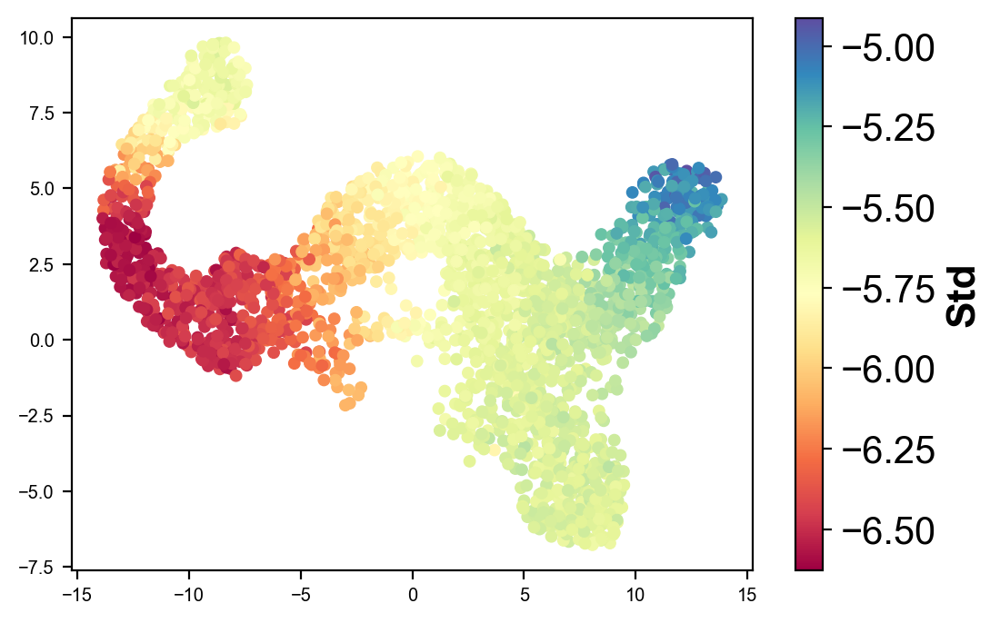

In [37]:
cmap = plt.colormaps['Spectral']
plt.scatter(X_umap[:,0], X_umap[:,1],c=np.log(np.std(eigs,axis=1)), cmap=cmap, s=20)
# plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('Std',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)


# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
plt.show()

In [40]:
import numpy as np
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

def otsu_threshold(feature):
    """
    使用Otsu算法计算最佳阈值
    :param feature: 特征向量 (n_samples,)
    :return: 最佳阈值
    """
    # 归一化特征值到0-255范围（模拟灰度图像）
    normalized_feature = (feature - np.min(feature)) / (np.max(feature) - np.min(feature) + 1e-8)
    scaled_feature = (normalized_feature * 255).astype(np.uint8)
    
    # 计算直方图
    hist, bin_edges = np.histogram(scaled_feature, bins=256, range=(0, 255))
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # 计算概率
    total_pixels = np.sum(hist)
    prob = hist / total_pixels
    
    # 初始化变量
    max_variance = 0
    best_threshold = 0
    
    # 遍历所有可能的阈值
    for threshold in range(1, 255):
        # 背景类 (值 <= 阈值)
        bg_prob = np.sum(prob[:threshold])
        bg_mean = np.sum(bin_centers[:threshold] * prob[:threshold]) / (bg_prob + 1e-8)
        
        # 前景类 (值 > 阈值)
        fg_prob = np.sum(prob[threshold:])
        fg_mean = np.sum(bin_centers[threshold:] * prob[threshold:]) / (fg_prob + 1e-8)
        
        # 计算类间方差
        between_class_variance = bg_prob * fg_prob * (bg_mean - fg_mean) ** 2
        
        # 更新最佳阈值
        if between_class_variance > max_variance:
            max_variance = between_class_variance
            best_threshold = threshold
    
    # 将阈值转换回原始特征范围
    original_threshold = (best_threshold / 255) * (np.max(feature) - np.min(feature)) + np.min(feature)
    return original_threshold

def otsu_based_segmentation(feature,sf=1.0):
    """
    基于Otsu算法进行特征分割
    :param feature: 特征向量 (n_samples,)
    :return: 分割标签 (0=较小值, 1=较大值)
    """
    threshold = otsu_threshold(feature)*sf
    labels = np.zeros_like(feature, dtype=int)
    labels[feature > threshold] = 1
    return labels

def analyze_label_association(labels1, labels2):
    """
    分析两种分割结果的关联性
    :return: ARI, NMI, 列联表
    """
    # 计算调整兰德指数(ARI)
    ari = adjusted_rand_score(labels1, labels2)
    
    # 计算标准化互信息(NMI)
    nmi = normalized_mutual_info_score(labels1, labels2)
    
    # 构建列联表
    unique1, counts1 = np.unique(labels1, return_counts=True)
    unique2, counts2 = np.unique(labels2, return_counts=True)
    contingency = np.zeros((len(unique1), len(unique2)))
    
    for i, l1 in enumerate(unique1):
        for j, l2 in enumerate(unique2):
            contingency[i, j] = np.sum((labels1 == l1) & (labels2 == l2))
    
    return ari, nmi#, contingency

In [41]:
vary_dim=np.zeros((n_cells,))
for i in range(L):

    ncs_labels=otsu_based_segmentation(negative_corr_strength[:,i],sf=1.0)
    ncs_inds=np.where(ncs_labels==1)[0]
    lwd_labels=otsu_based_segmentation(local_Wa_dim[:,i],sf=1.)
    lwd_inds=np.where(lwd_labels==1)[0]
    # ari = adjusted_rand_score(ncs_labels, lwd_labels)
    # print(ari)

    lwd_label_consistency = np.mean([sum(1 for nbr in cell_nei[node,1:] if lwd_labels[nbr] == 1) / len(cell_nei[node,:]) for node in lwd_inds])
    print('lwd consis',lwd_label_consistency)
    ncs_label_consistency = np.mean([sum(1 for nbr in cell_nei[node,1:] if ncs_labels[nbr] == 1) / len(cell_nei[node,:]) for node in ncs_inds])
    print('ncs consis',ncs_label_consistency)

    
    delta_dim=((ncs_labels+lwd_labels)>1).astype(np.float16)
    delta_inds=np.where(delta_dim==1)[0]

    dim_label_consistency = np.mean([sum(1 for nbr in cell_nei[node,1:] if delta_dim[nbr] == 1) / len(cell_nei[node,:]) for node in delta_inds])
    print(dim_label_consistency)

    if dim_label_consistency>0.3:
        vary_dim=vary_dim+delta_dim

lwd consis 0.5166951566951566
ncs consis 0.5997685185185185
0.553256704980843
lwd consis 0.553061224489796
ncs consis 0.5756756756756756
0.5988571428571429
lwd consis 0.5400419287211741
ncs consis 0.5085714285714287
0.4092140921409214
lwd consis 0.5500841750841751
ncs consis 0.6961337513061651
0.6175084175084175
lwd consis 0.5564102564102564
ncs consis 0.5095495495495496
0.4402035623409669
lwd consis 0.5248735632183908
ncs consis 0.6251173708920188
0.5879725085910653
lwd consis 0.5195069667738478
ncs consis 0.6235474006116208
0.013333333333333332


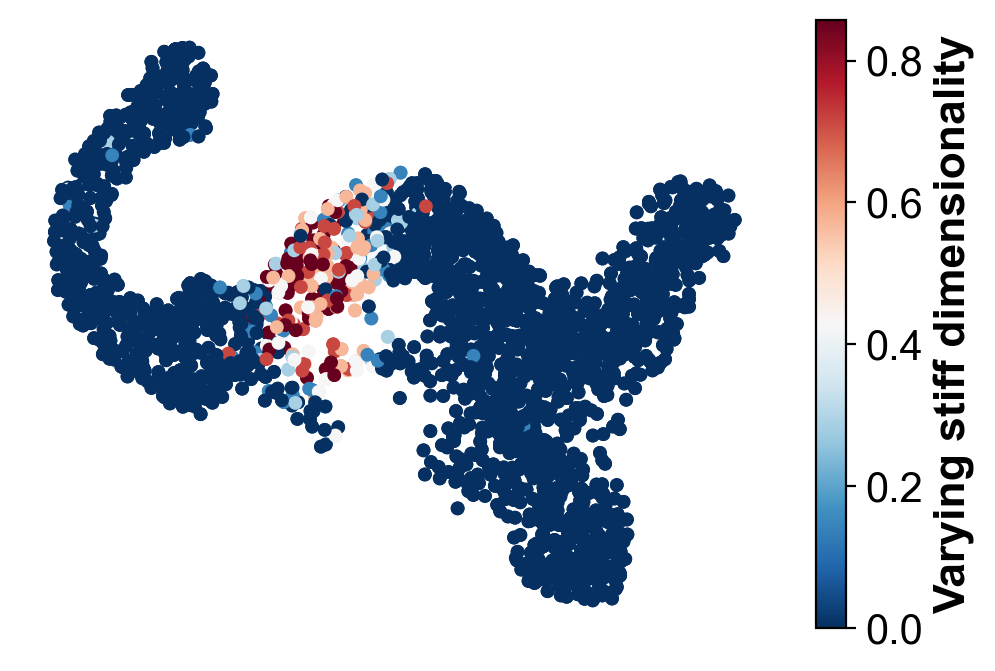

In [42]:
    
cmap = plt.colormaps['RdBu_r']

plt.scatter(X_umap[:,0], X_umap[:,1],c=smooth_func(vary_dim/L,cell_nei,nei_w), cmap=cmap, s=20)
# plt.axis('off')
plt.scatter(X_umap[:,0], X_umap[:,1],c=vary_dim/L, cmap=cmap, s=20)

clb=plt.colorbar()
clb.ax.set_ylabel('Varying stiff dimensionality',fontsize=16,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)


# plt.xlabel('Pseudo-time',fontsize=16,weight='bold')
plt.axis('off')
# plt.title('stiff variation',fontsize=16,weight='bold')
plt.savefig(result_path+'EG_stiff_variation.png')

plt.show()
